# Urban Sound MLP Classification

### Introduction

This Jupyter notebook was created by Filipe Barros, Gonçalo Arrobas and João Barão for the Machine Learning II.

### Authorship

Author: Filipe Barros, Gonçalo Arrobas and João Barão University: Faculty of Science from University of Porto Course: Machine Learning II Sound Classification Problem

For this project, the students were tasked with the development of a deed learning model for audio classification. The data from the UrbanSound8K dataset was used throughout the development of this project. This dataset contains a total of 8732 labeled audio recordings of urban sounds, each with a duration of up to four seconds. Each excerpts has been labeled with one of the following classes:

0 = air_conditioner

1 = car_horn

2 = children_playing

3 = dog_bark

4 = drilling

5 = engine_idling

6 = gun_shot

7 = jackhammer

8 = siren

9 = street_music

The objective of this project relies on defining, compiling, training and evaluating three Deep Learning (DL) classifiers. The DL model types to be considered are:

Multilayer Perceptron (MLP) Convolutional Neural Network (CNN) Recurrent Neural Network (RNN)

### Import statements

In [ ]:
import re
import numpy as np
import pandas as pd
import seaborn as sns
import librosa
import tensorflow as tf
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix
import tensorflow as tf
import keras_tuner as kt

### Data Analysis

In [46]:

# Load metadata as a Pandas dataframe
metadata = pd.read_csv('UrbanSound8K/metadata/UrbanSound8K.csv')

# Examine dataframe's head
metadata.head()


,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


In [47]:
metadata['class'].value_counts()

class
dog_bark            1000
children_playing    1000
air_conditioner     1000
street_music        1000
jackhammer          1000
engine_idling       1000
drilling            1000
siren                929
car_horn             429
gun_shot             374
Name: count, dtype: int64

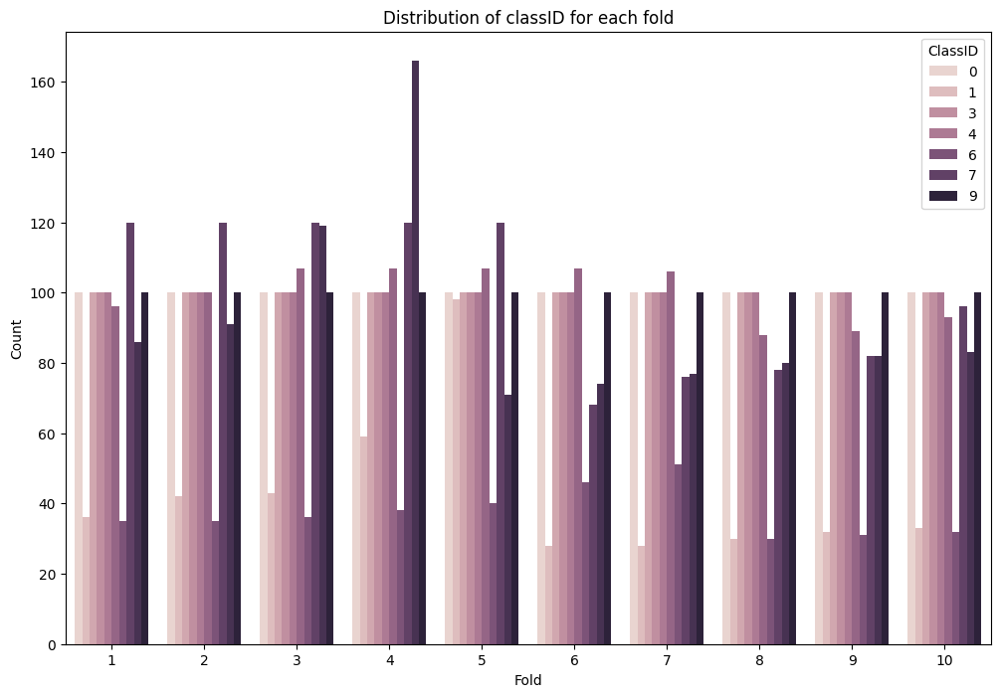

In [48]:
# Plot the distribution of classID for each fold
plt.figure(figsize=(12, 8))
sns.countplot(data=metadata, x='fold', hue='classID')
plt.title('Distribution of classID for each fold')
plt.xlabel('Fold')
plt.ylabel('Count')
plt.legend(title='ClassID', loc='upper right')
plt.show()

In [14]:
datasets = [pd.read_csv(f'urbansounds_featuresfold{i}.csv') for i in range(1, 11)]

In [34]:
datasets13= [pd.read_csv(f'UrbanSound8k/features/urbansounds_13features_foldfold{i}.csv') for i in range(1, 11)]

Feature engeneering

In [67]:
def check_min_max_values():
    for i, df in enumerate(datasets[:10]):
        numeric_features = df.select_dtypes(include=['int', 'float'])
    
        print(f"Dataset {i + 1}:")
        for column in numeric_features.columns:
            min_val = numeric_features[column].min()
            max_val = numeric_features[column].max()
            print(f"  Feature: {column}, Min: {min_val}, Max: {max_val}")
    
        print("\n" + "="*30 + "\n")

In [17]:
def calculate_mean_from_string(string):
    cleaned_string = string.replace('\n', '')
    numbers = re.findall(r"[-+]?\d*\.\d+|\d+", cleaned_string)
    array = np.array(numbers, dtype=float)
    mean_value = np.mean(array)
    return mean_value

In [ ]:
for df in datasets:
    for column in df.columns:
        if column != 'Label':
            if df[column].dtype != float and df[column].dtype != int:
                df[column] = df[column].apply(calculate_mean_from_string)
            df[column] = (df[column] - df[column].min()) / (df[column].max() - df[column].min())
        else:
            df[column] = df[column].str.split('-').str[1].astype(int)

for df in datasets13:
    for column in df.columns:
        if column != 'Label':
            if df[column].dtype != float and df[column].dtype != int:
                df[column] = df[column].apply(calculate_mean_from_string)
            df[column] = (df[column] - df[column].min()) / (df[column].max() - df[column].min())
        else:
            df[column] = df[column].str.split('-').str[1].astype(int)

In [19]:
print(f"Número de folds: {len(datasets)}")
total_samples = 0
for i, fold in enumerate(datasets):
    print(f"Fold {i}: {len(fold)} amostras")
    total_samples += len(fold)
print(f"Total de amostras em todos os folds: {total_samples}")


Número de folds: 10
Fold 0: 873 amostras
Fold 1: 888 amostras
Fold 2: 925 amostras
Fold 3: 990 amostras
Fold 4: 936 amostras
Fold 5: 823 amostras
Fold 6: 838 amostras
Fold 7: 806 amostras
Fold 8: 816 amostras
Fold 9: 837 amostras
Total de amostras em todos os folds: 8732


Label
7    120
3    100
4    100
2    100
0    100
9    100
5     96
8     86
1     36
6     35
Name: count, dtype: int64
Label
7    120
3    100
5    100
4    100
0    100
2    100
9    100
8     91
1     42
6     35
Name: count, dtype: int64
Label
7    120
8    119
5    107
3    100
4    100
2    100
0    100
9    100
1     43
6     36
Name: count, dtype: int64
Label
8    166
7    120
5    107
3    100
9    100
4    100
0    100
2    100
1     59
6     38
Name: count, dtype: int64
Label
7    120
5    107
2    100
3    100
0    100
9    100
4    100
1     98
8     71
6     40
Name: count, dtype: int64
Label
5    107
3    100
2    100
4    100
9    100
0    100
8     74
7     68
6     46
1     28
Name: count, dtype: int64
Label
5    106
9    100
2    100
4    100
3    100
0    100
8     77
7     76
6     51
1     28
Name: count, dtype: int64
Label
3    100
9    100
4    100
0    100
2    100
5     88
8     80
7     78
1     30
6     30
Name: count, dtype: int64
Label
0    100
3    100


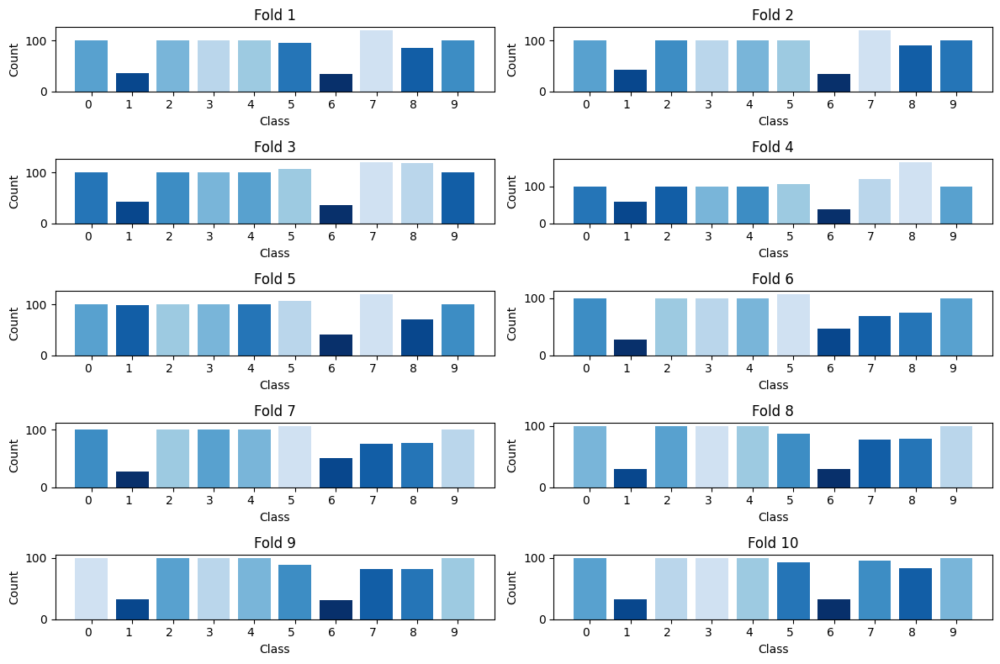

In [49]:
def plot_class_distribution(dataset):
    fold = 0
    rows = int(np.ceil(len(dataset) / 2))
    cols = 2
    fig, axs = plt.subplots(rows, cols, figsize=(12, 8))
    cmap = plt.get_cmap('Blues')

    for df, ax in zip(dataset, axs.flat):
        class_counts = df['Label'].value_counts()
        print(df['Label'].value_counts())
        class_labels = class_counts.index
        class_values = class_counts.values
        colors = cmap(np.linspace(0.2, 1, len(class_labels)))
        ax.bar(class_labels, class_values, color=colors)
        ax.set(xlabel='Class', ylabel='Count', title=f'Fold {fold + 1}')
        ax.set_xticks(class_labels)
        ax.set_xticklabels(class_labels, rotation=0, ha='right')  # Set rotation to 0 for vertical orientation

        fold += 1

    plt.tight_layout()
    plt.show()


plot_class_distribution(datasets)

In [21]:
def plot_graphs(history, y_true, y_pred, class_labels):
    # Create a 1x3 grid for subplots
    fig, axs = plt.subplots(1, 3, figsize=(18, 4))

    # Plot accuracy values
    axs[0].plot(history.history['accuracy'])
    axs[0].plot(history.history['val_accuracy'])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].legend(['Train', 'Validation'], loc='upper left')

    # Plot loss values
    axs[1].plot(history.history['loss'])
    axs[1].plot(history.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].legend(['Train', 'Validation'], loc='upper left')

    # Plot confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels, ax=axs[2])
    axs[2].set_title('Confusion Matrix')
    axs[2].set_xlabel('Predicted')
    axs[2].set_ylabel('True')

    # Adjust layout
    plt.tight_layout()
    plt.show()

In [ ]:
def prepare_datasets(fold):
    test_data = datasets[fold]
    test_labels = test_data['Label'].values
    test_data = test_data.drop(columns=['Label']).values

    train_datasets = datasets[:fold] + datasets[fold + 1:]
    train_data = pd.concat(train_datasets)

    smote = SMOTE(sampling_strategy='auto', random_state=42)

    train_data, train_labels = smote.fit_resample(train_data, train_data['Label'])
    train_data = train_data.drop(columns=['Label']).values

    return train_data, train_labels, test_data, test_labels

def prepare_datasets13(fold):
    test_data = datasets13[fold]
    test_labels = test_data['Label'].values
    test_data = test_data.drop(columns=['Label']).values

    train_datasets = datasets13[:fold] + datasets13[fold + 1:]
    train_data = pd.concat(train_datasets)

    smote = SMOTE(sampling_strategy='auto', random_state=42)

    train_data, train_labels = smote.fit_resample(train_data, train_data['Label'])
    train_data = train_data.drop(columns=['Label']).values

    return train_data, train_labels, test_data, test_labels


def prepare_datasetsjust13(fold):
   
    test_data = datasets13[fold]
    test_labels = test_data['Label'].values
    

    test_data = test_data.filter(like='mfcc').values


    train_datasets = datasets13[:fold] + datasets13[fold + 1:]
    train_data = pd.concat(train_datasets)
    

    smote = SMOTE(sampling_strategy='auto', random_state=42)
    train_data_mfcc = train_data.filter(like='mfcc')
    train_labels = train_data['Label']

    train_data_mfcc, train_labels = smote.fit_resample(train_data_mfcc, train_labels)

    train_data = train_data_mfcc.values

    return train_data, train_labels, test_data, test_labels

def prepare_datasets_nomfcc(fold):

    test_data = datasets13[fold]
    test_labels = test_data['Label'].values

    selected_columns = ['chroma_stft', 'chroma_cqt', 'chroma_cens', 'melspectogram', 'rms', 'centroid',
                        'bandwidth', 'contrast', 'flatness', 'rolloff', 'crossing_rate', 'tempogram',
                        'fourier_tempogram']
    test_data = test_data[selected_columns]

    
    train_datasets = datasets13[:fold] + datasets13[fold + 1:]
    train_data = pd.concat(train_datasets)

    
    train_data_selected = train_data[selected_columns]
    train_labels = train_data['Label'].values

    
    smote = SMOTE(sampling_strategy='auto', random_state=42)
    train_data_selected, train_labels = smote.fit_resample(train_data_selected, train_labels)

    
    test_data = test_data.values

    return train_data_selected.values, train_labels, test_data, test_labels

### Data Augmentation

In [ ]:
def augment_features(features):
    noise = np.random.normal(0, 0.01, size=features.shape)  
    scaled = features * np.random.uniform(0.9, 1.1)  
    return scaled + noise


# Função para carregar e padronizar o tamanho das amostras
def load_and_pad_audio(file_path, sr=22050, target_length=22050):
    # Carregar áudio
    audio, _ = librosa.load(file_path, sr=sr)
    
    # Se o áudio for mais longo do que o tamanho alvo corta
    if len(audio) > target_length:
        audio = audio[:target_length]
    # Se o áudio for mais curto do que o tamanho alvo faz padding
    elif len(audio) < target_length:
        audio = np.pad(audio, (0, target_length - len(audio)), mode='constant')
    
    return audio


def prepare_datasetsda(fold, augment=False):
    
    test_data_df = datasets[fold]
    test_labels = test_data_df['Label'].values
    test_data = test_data_df.drop(columns=['Label']).values

    
    train_datasets = datasets[:fold] + datasets[fold + 1:]
    train_data_df = pd.concat(train_datasets)

    train_labels = train_data_df['Label'].values
    train_data = train_data_df.drop(columns=['Label']).values

    if augment:
        
        augmented_train_data = []
        for feature_vector in train_data:
            augmented_vector = augment_features(feature_vector)
            augmented_train_data.append(augmented_vector)
        train_data = np.array(augmented_train_data)

    return train_data, train_labels, test_data, test_labels


### Model Architecture

In [ ]:
def build_MLP(input_neurons, hidden_neurons, output_neurons, learning_rate, regulizer, dropout):
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    model = tf.keras.Sequential([
    tf.keras.layers.Dense(units=input_neurons, kernel_regularizer=tf.keras.regularizers.L1L2(l1=regulizer, l2=regulizer)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dropout(dropout),
    tf.keras.layers.Dense(units=hidden_neurons, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(dropout),
    tf.keras.layers.Dense(units=output_neurons, activation="softmax")
])

    model.compile(optimizer=optimizer, 
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), 
                  metrics=['accuracy'])
    return model


In [69]:
def train_MLP(mlp_model, train_data, train_labels, test_data, test_labels, patience, batch_size, num_epochs):
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=patience, restore_best_weights=True)
    history = mlp_model.fit(train_data, train_labels,
                        epochs=num_epochs,
                        batch_size=batch_size,
                        callbacks = [early_stopping],
                        validation_data = (test_data,test_labels),
                        verbose=0)
    
    return history

In this project, we conducted extensive experimentation to optimize the performance of an MLP (Multi-Layer Perceptron) model for sound classification tasks using the UrbanSound8K dataset. The approach involved several key steps, focusing on feature selection, data augmentation, model tuning, and the evaluation of various training configurations.

1. Feature Selection:
We initially worked with a set of 13 features extracted from the Librosa library. These 13 features provide essential characteristics of audio signals, such as spectral information, which can help in distinguishing between different sound classes.

To enhance the model’s capacity to learn from the data, we expanded the feature set by including 13 MFCC (Mel-frequency cepstral coefficients) features. MFCCs are widely used in speech and audio processing due to their ability to capture the perceptual features of sound, which is crucial for classifying sound data.

We further tested additional features by including a combination of the 13 MFCCs with other audio descriptors like chroma, spectral contrast, and tonnetz, among others. Finally, we experimented with 40 MFCCs, paired with the aforementioned features, to assess if a larger set of features would improve the model’s performance.

2. Data Augmentation:
To further improve model robustness and generalize better on unseen data, we applied data augmentation techniques, particularly by adding noise to the audio samples. This process introduces variability to the training data, simulating real-world scenarios where sounds might be contaminated with background noise. We also tested the model without data augmentation to understand the impact on its performance.

3. Model Tuning and Hyperparameter Optimization:
We made use of hyperparameter tuning to identify the best set of parameters for our model. This included tuning parameters like the learning rate, number of neurons, batch size, and regularization strength. The model was tested with various batch sizes to find the optimal value, as batch size significantly influences the training process, with smaller batch sizes providing more granular updates to the model's weights.

4. Optimizer Testing:
We experimented with different optimizers to determine which one would work best for the given task. The optimizers tested included:

Adam: Known for its adaptive learning rate, Adam is a widely used optimizer in deep learning, providing fast convergence.
SGD (Stochastic Gradient Descent): A more traditional optimizer, with a simpler update rule, used with momentum to accelerate convergence and avoid local minima.
RMSprop: An optimizer that adjusts the learning rate based on recent gradient information, often used for non-stationary problems.
Adagrad: An optimizer that adapts the learning rate for each parameter, beneficial for sparse data.
5. Overfitting Mitigation:
To combat overfitting, we tried several strategies:

Dropout: A technique where randomly selected neurons are "dropped" during training to prevent the model from becoming too reliant on certain features.
L1 and L2 Regularization: We applied both L1 and L2 regularization to the model’s weights, which helps to constrain the model and prevent it from fitting noise in the data.
Number of Neurons: We experimented with different configurations of neurons in the hidden layers. We started with a handmade approach, testing various architectures to find an appropriate balance between model complexity and generalization.
6. Evaluation:
After conducting all the experiments, we evaluated the models using accuracy as the primary metric. Each combination of features, data augmentation, optimizer, and training configuration was tested, and the results were compared to assess the impact of each factor on the model's performance.

In summary, this process involved thorough testing and optimization of the MLP model, covering different feature sets, training techniques, and model parameters. The goal was to improve the model's ability to generalize to unseen data, reduce overfitting, and achieve the best possible classification performance on the UrbanSound8K dataset.

Just 13 mfcc

Fold 1
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


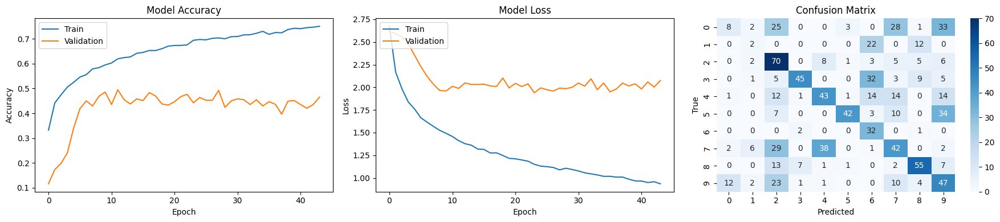

Fold 2
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


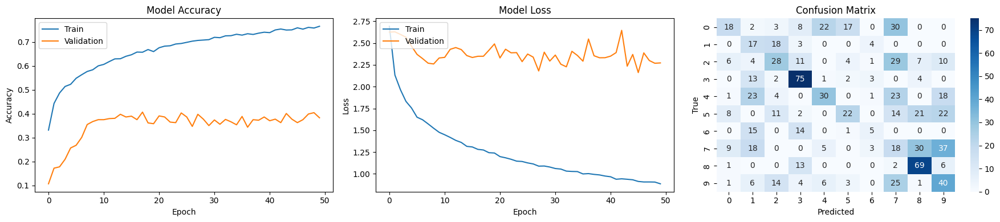

Fold 3
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


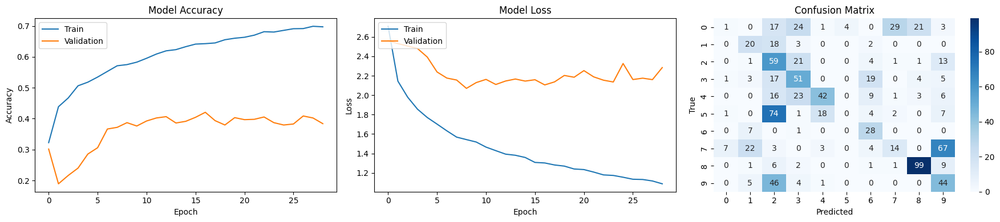

Fold 4
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


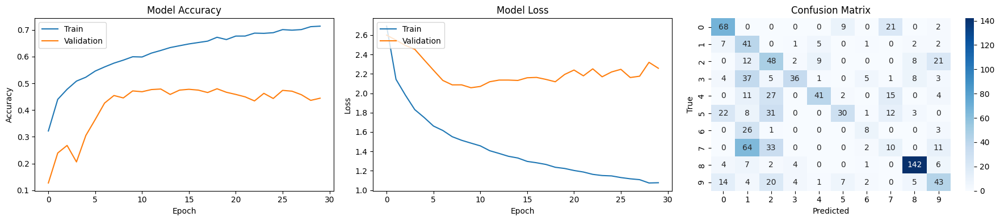

Fold 5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


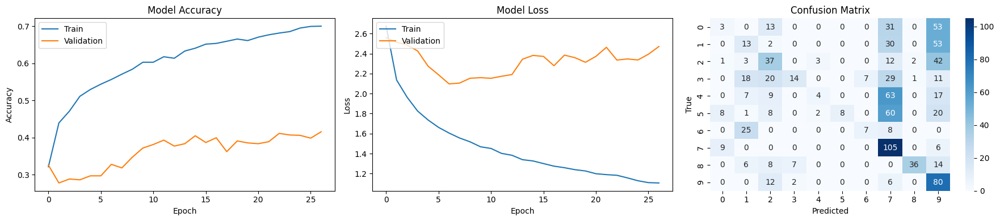

Fold 6
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


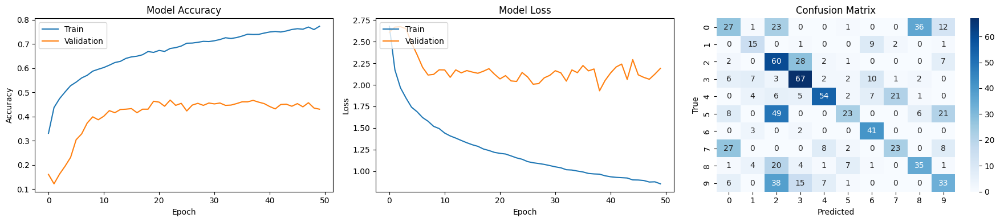

Fold 7
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


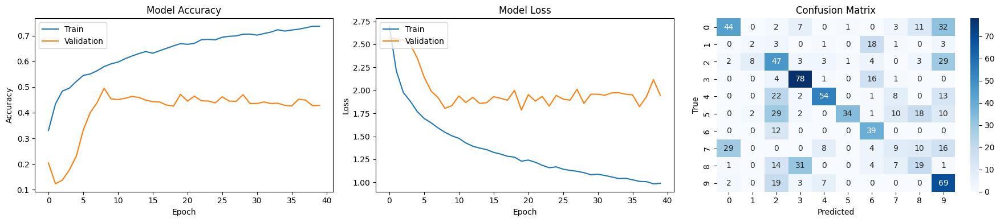

Fold 8
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


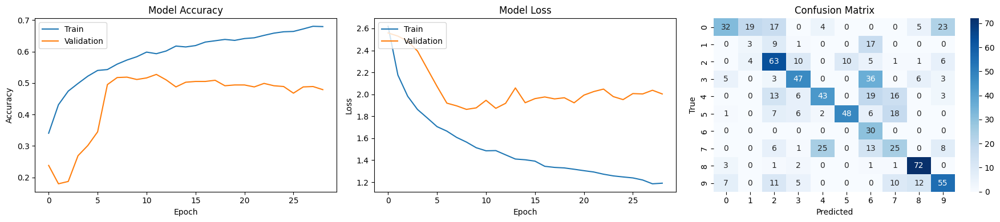

Fold 9
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


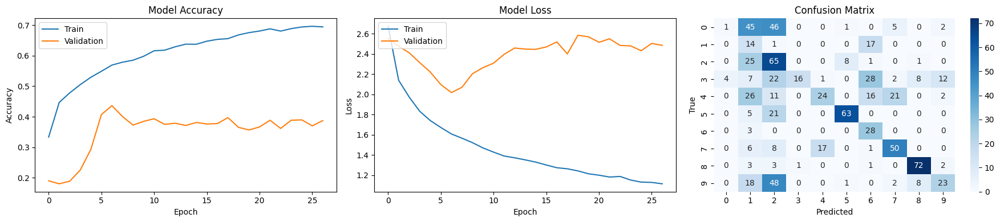

Fold 10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


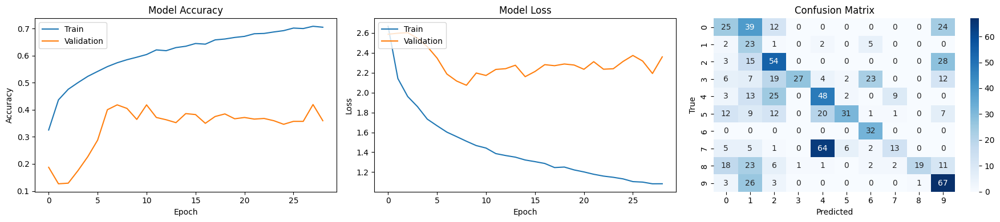


Average Accuracy for MLP: 0.4282
Standard Deviation for MLP Accuracy: 0.0545


In [ ]:
cv_scores_mlp = []

for fold in range(10):
    print(f"Fold {fold + 1}")
    train_data, train_labels, test_data, test_labels = prepare_datasetsjust13(fold)

    

    mlp_model = build_MLP(input_neurons=512,
                      hidden_neurons=512,
                      output_neurons=10,
                      learning_rate=0.0003,
                      regulizer=0.001,
                      dropout=0.5)

    history = train_MLP(mlp_model, train_data, train_labels, test_data, test_labels,
                        patience=20,
                        batch_size=128,
                        num_epochs=50)

    predictions = mlp_model.predict(test_data)
    predicted_labels = np.argmax(predictions, axis=1)
    
    plot_graphs(history, test_labels, predicted_labels, class_labels=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'])
    
    accuracy = accuracy_score(test_labels, predicted_labels)
    cv_scores_mlp.append(accuracy)

overall_average_accuracy_mlp = np.mean(cv_scores_mlp)
print(f"\nAverage Accuracy for MLP: {overall_average_accuracy_mlp:.4f}")
mlp_std = np.std(cv_scores_mlp)
print(f"Standard Deviation for MLP Accuracy: {mlp_std:.4f}")

Apenas as primeiras 13

Fold 1
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


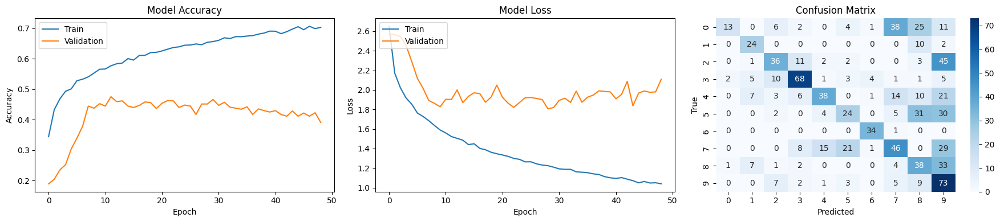

Fold 2
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


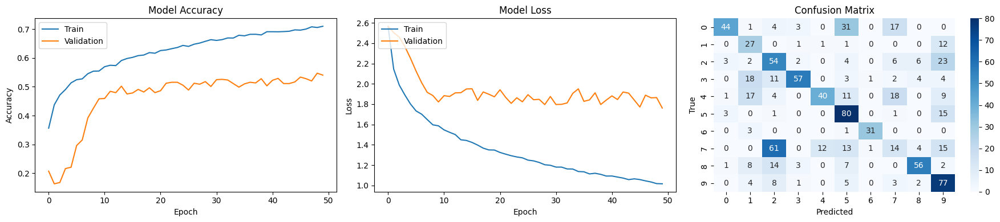

Fold 3
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


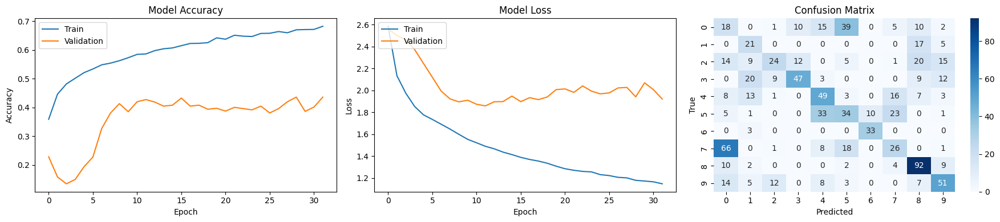

Fold 4
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


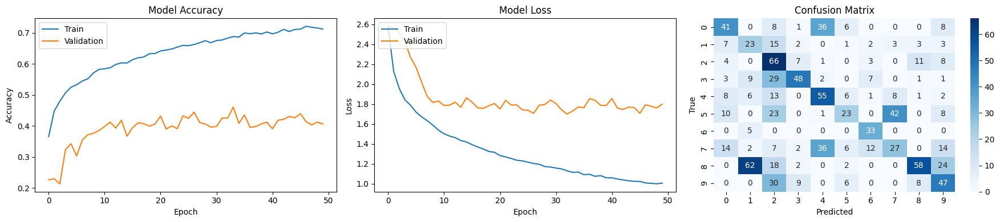

Fold 5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


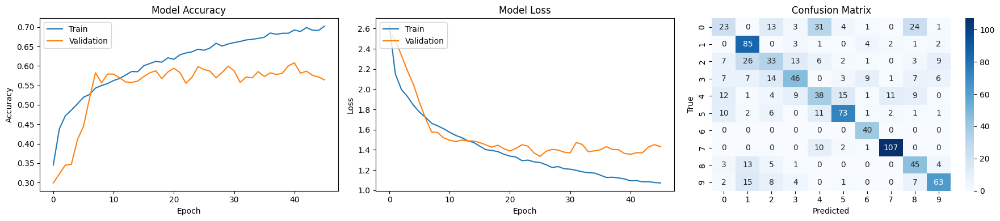

Fold 6
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


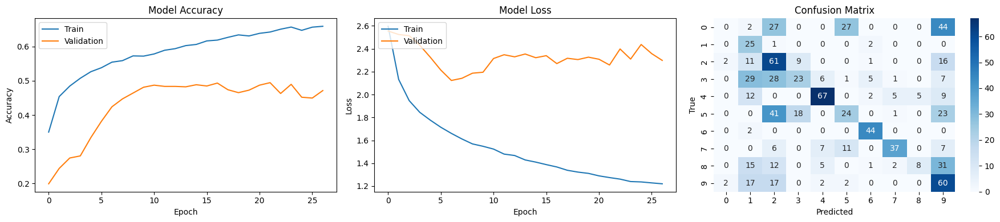

Fold 7
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


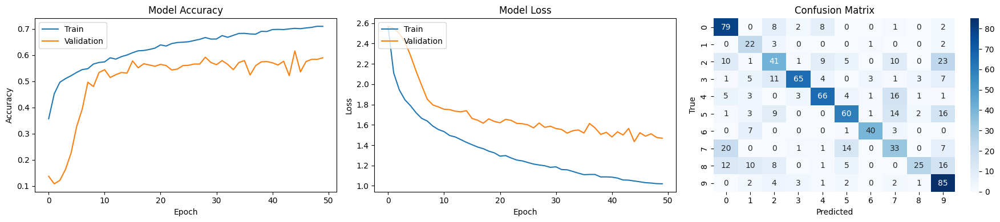

Fold 8
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


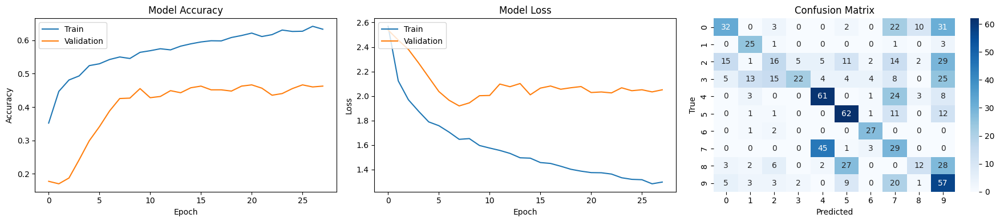

Fold 9
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


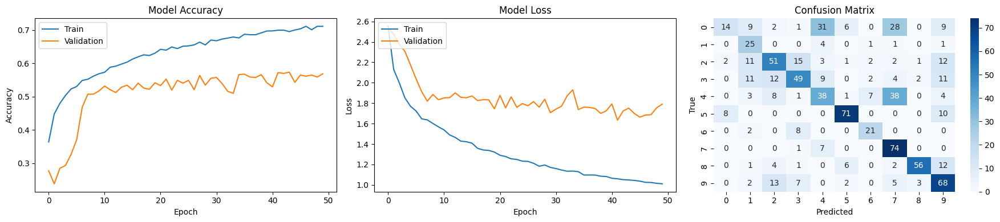

Fold 10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


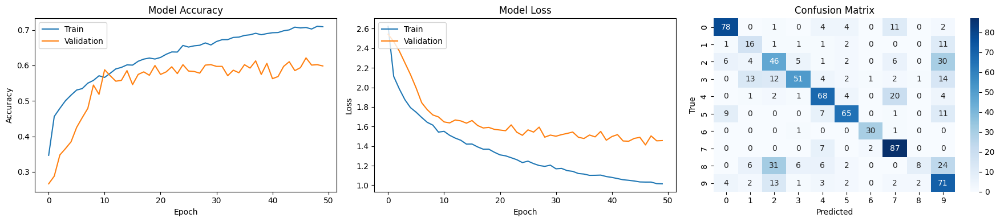


Average Accuracy for MLP: 0.5094
Standard Deviation for MLP Accuracy: 0.0818


In [41]:
cv_scores_mlp = []

for fold in range(10):
    print(f"Fold {fold + 1}")
    train_data, train_labels, test_data, test_labels = prepare_datasets_nomfcc(fold)

    

    mlp_model = build_MLP(input_neurons=512,
                      hidden_neurons=512,
                      output_neurons=10,
                      learning_rate=0.0003,
                      regulizer=0.001,
                      dropout=0.5)

    history = train_MLP(mlp_model, train_data, train_labels, test_data, test_labels,
                        patience=20,
                        batch_size=128,
                        num_epochs=50)

    predictions = mlp_model.predict(test_data)
    predicted_labels = np.argmax(predictions, axis=1)
    
    plot_graphs(history, test_labels, predicted_labels, class_labels=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'])
    
    accuracy = accuracy_score(test_labels, predicted_labels)
    cv_scores_mlp.append(accuracy)

overall_average_accuracy_mlp = np.mean(cv_scores_mlp)
print(f"\nAverage Accuracy for MLP: {overall_average_accuracy_mlp:.4f}")
mlp_std = np.std(cv_scores_mlp)
print(f"Standard Deviation for MLP Accuracy: {mlp_std:.4f}")

Primeiras 13 com mfcc

Fold 1
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


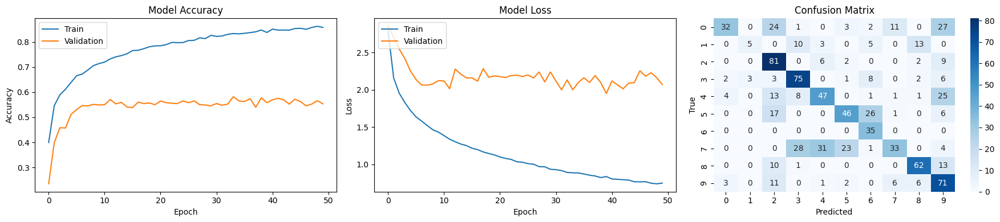

Fold 2
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


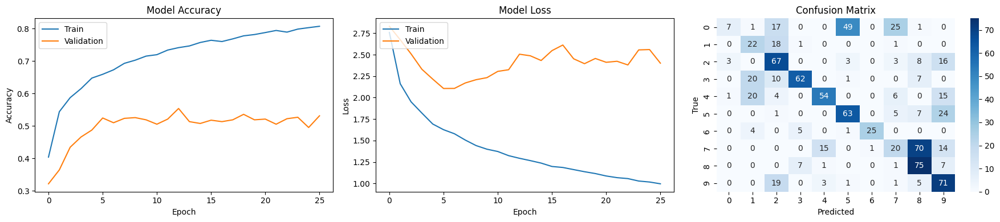

Fold 3
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


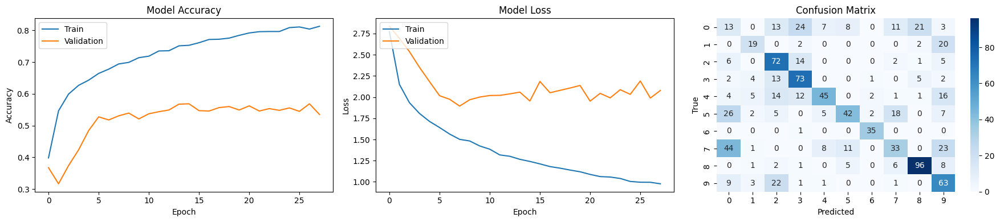

Fold 4
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


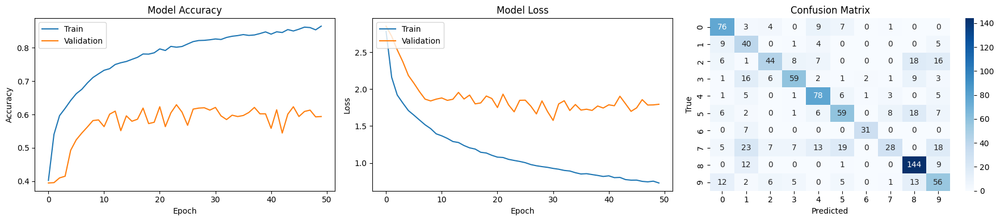

Fold 5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


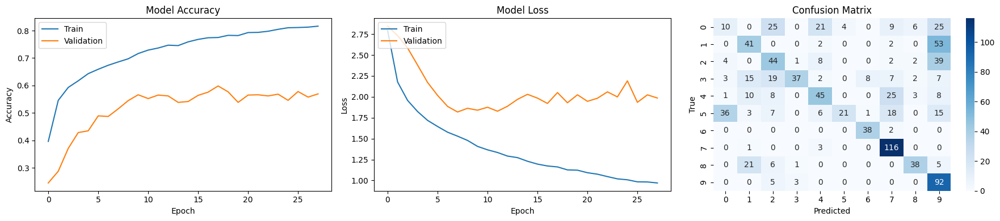

Fold 6
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


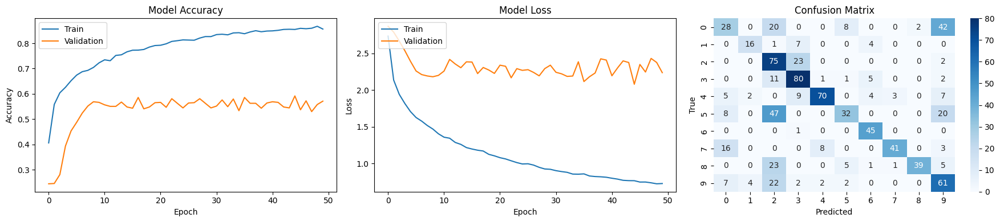

Fold 7
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


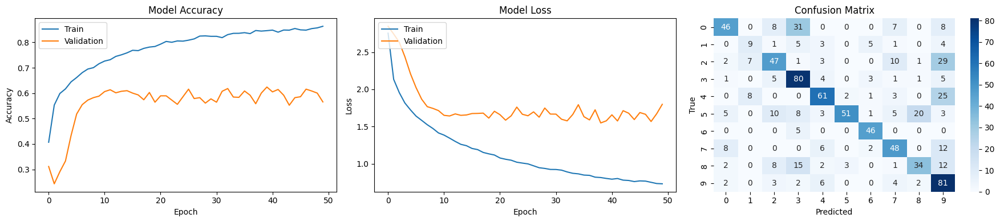

Fold 8
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


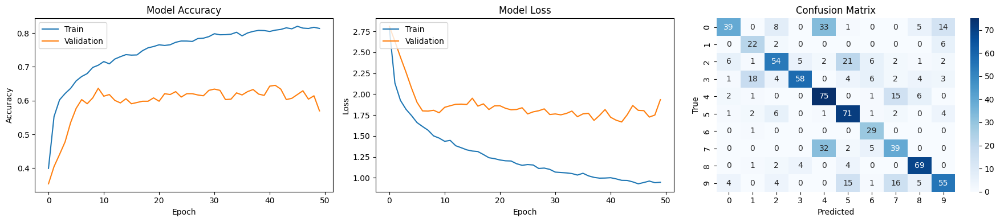

Fold 9
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


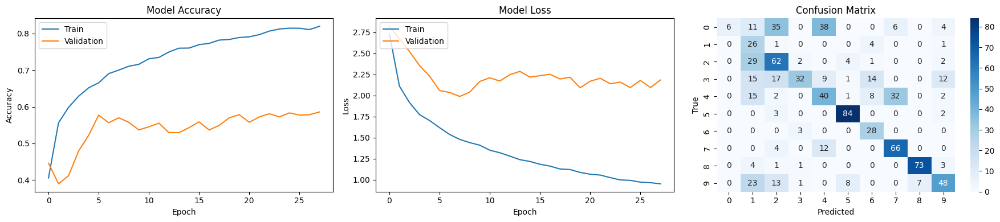

Fold 10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


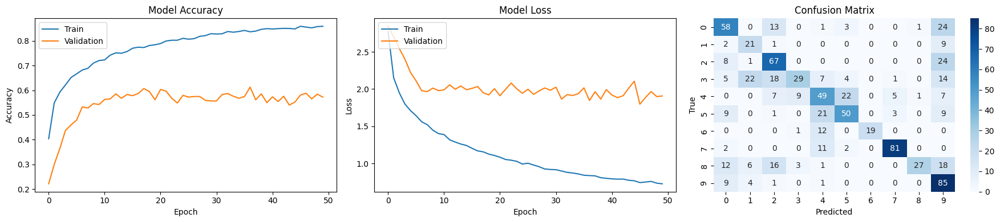


Average Accuracy for MLP: 0.5726
Standard Deviation for MLP Accuracy: 0.0386


In [ ]:
cv_scores_mlp = []

for fold in range(10):
    print(f"Fold {fold + 1}")
    train_data, train_labels, test_data, test_labels = prepare_datasets13(fold)

    

    mlp_model = build_MLP(input_neurons=512,
                      hidden_neurons=512,
                      output_neurons=10,
                      learning_rate=0.0003,
                      regulizer=0.001,
                      dropout=0.5)

    history = train_MLP(mlp_model, train_data, train_labels, test_data, test_labels,
                        patience=20,
                        batch_size=128,
                        num_epochs=50)

    predictions = mlp_model.predict(test_data)
    predicted_labels = np.argmax(predictions, axis=1)
    
    plot_graphs(history, test_labels, predicted_labels, class_labels=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'])
    
    accuracy = accuracy_score(test_labels, predicted_labels)
    cv_scores_mlp.append(accuracy)

overall_average_accuracy_mlp = np.mean(cv_scores_mlp)
print(f"\nAverage Accuracy for MLP: {overall_average_accuracy_mlp:.4f}")
mlp_std = np.std(cv_scores_mlp)
print(f"Standard Deviation for MLP Accuracy: {mlp_std:.4f}")

No data augmentation

Fold 1
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


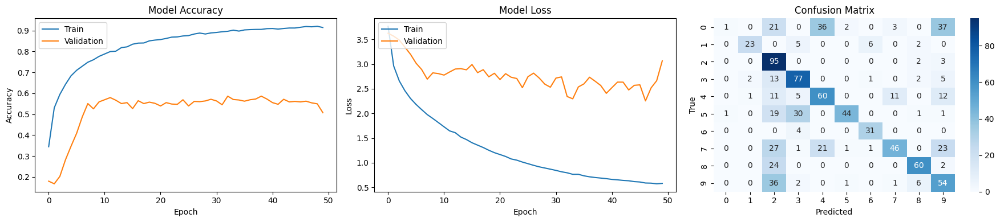

Fold 2
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


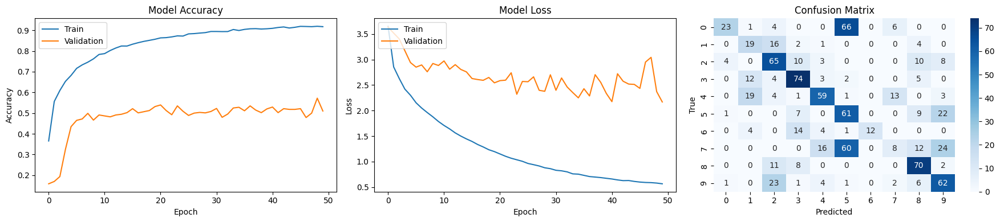

Fold 3
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


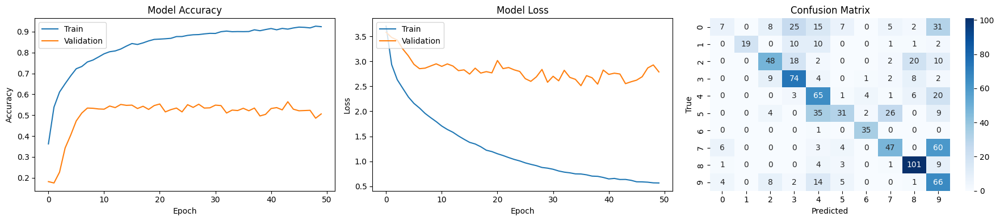

Fold 4
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


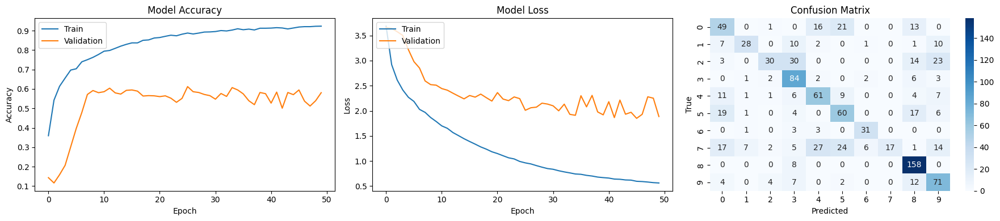

Fold 5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


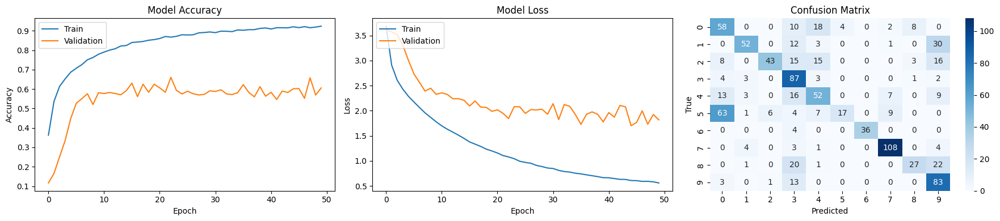

Fold 6
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


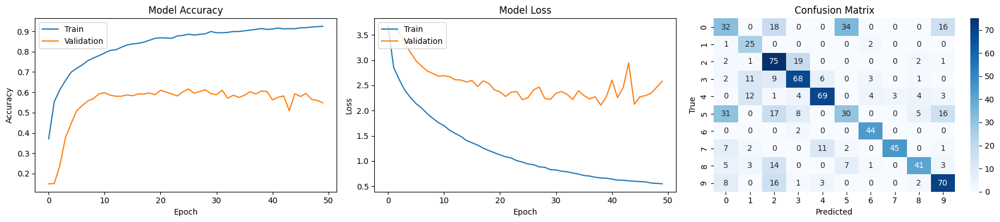

Fold 7
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


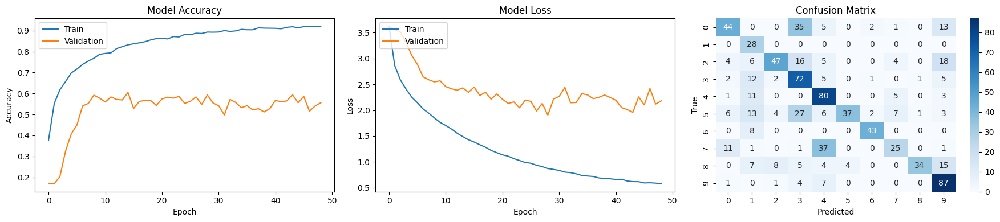

Fold 8
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


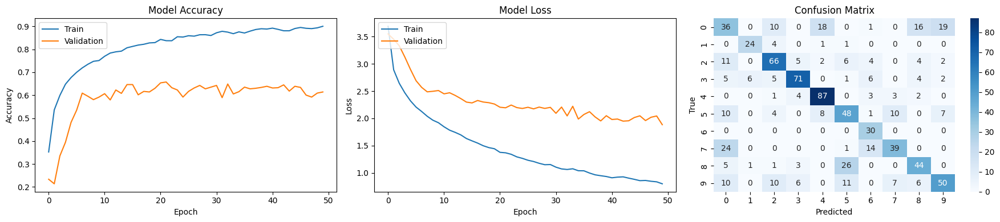

Fold 9
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


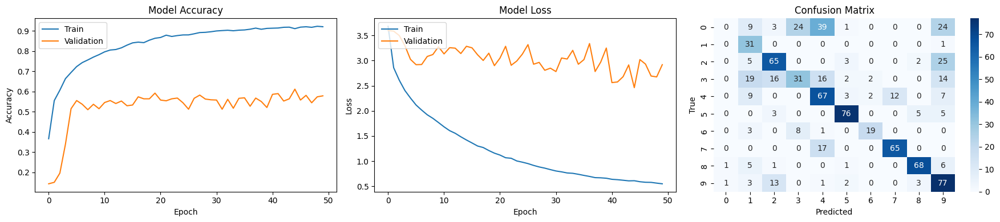

Fold 10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


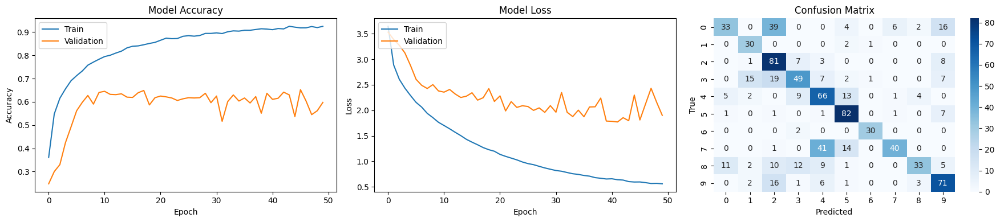


Average Accuracy for MLP: 0.5842
Standard Deviation for MLP Accuracy: 0.0349


In [51]:
cv_scores_mlp = []

for fold in range(10):
    print(f"Fold {fold + 1}")
    train_data, train_labels, test_data, test_labels = prepare_datasets(fold)

    

    mlp_model = build_MLP(input_neurons=512,
                      hidden_neurons=512,
                      output_neurons=10,
                      learning_rate=0.0003,
                      regulizer=0.001,
                      dropout=0.5)

    history = train_MLP(mlp_model, train_data, train_labels, test_data, test_labels,
                        patience=20,
                        batch_size=128,
                        num_epochs=50)

    predictions = mlp_model.predict(test_data)
    predicted_labels = np.argmax(predictions, axis=1)
    
    plot_graphs(history, test_labels, predicted_labels, class_labels=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'])
    
    accuracy = accuracy_score(test_labels, predicted_labels)
    cv_scores_mlp.append(accuracy)

overall_average_accuracy_mlp = np.mean(cv_scores_mlp)
print(f"\nAverage Accuracy for MLP: {overall_average_accuracy_mlp:.4f}")
mlp_std = np.std(cv_scores_mlp)
print(f"Standard Deviation for MLP Accuracy: {mlp_std:.4f}")

With Data Augmentation

Fold 1
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


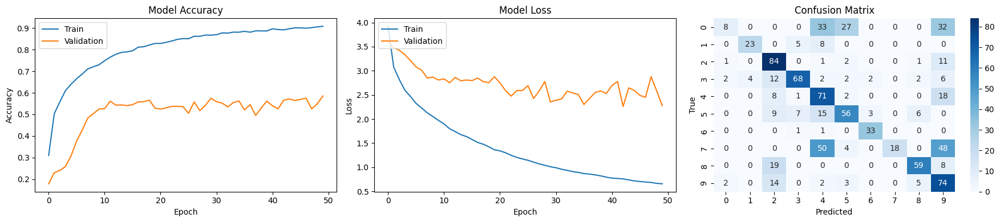

Fold 2
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


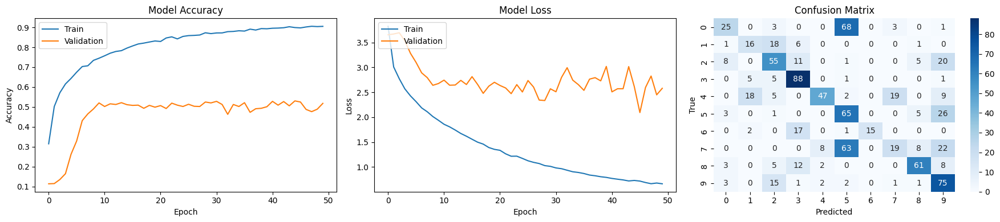

Fold 3
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


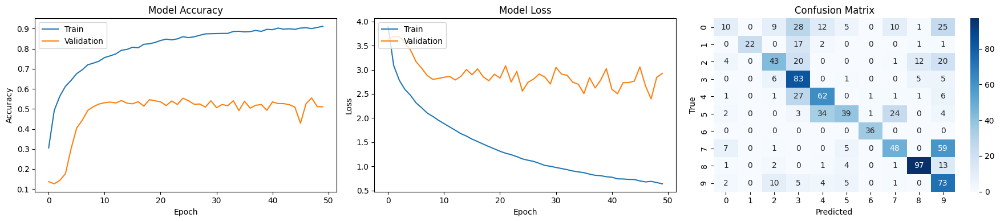

Fold 4
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


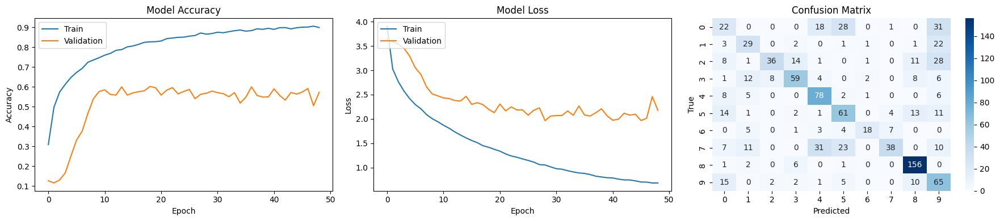

Fold 5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


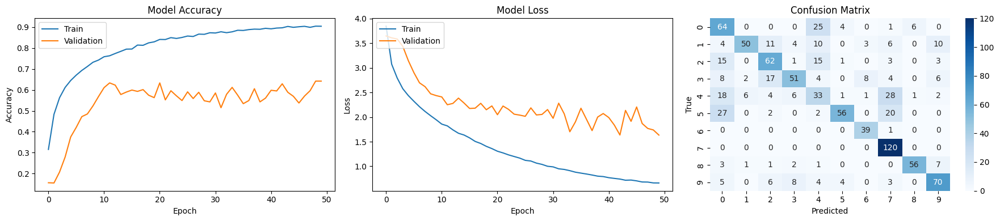

Fold 6
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


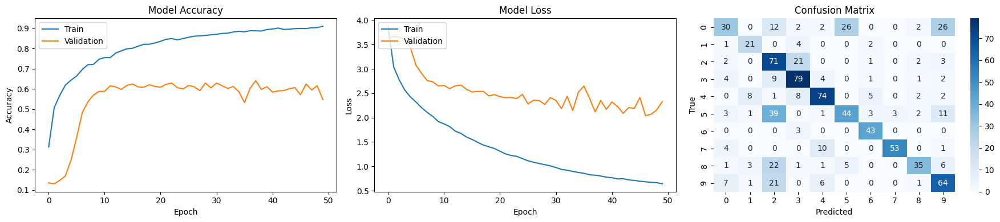

Fold 7
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


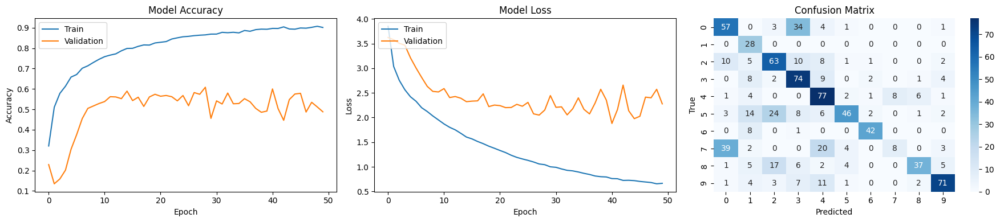

Fold 8
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


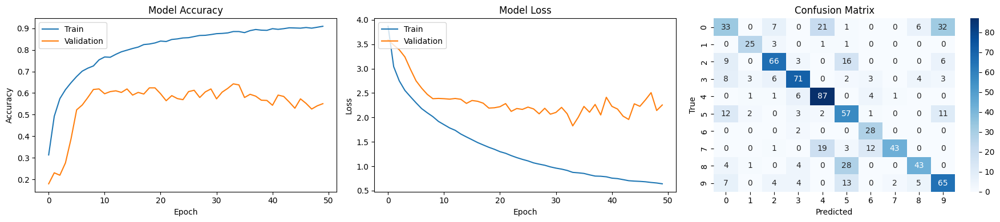

Fold 9
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


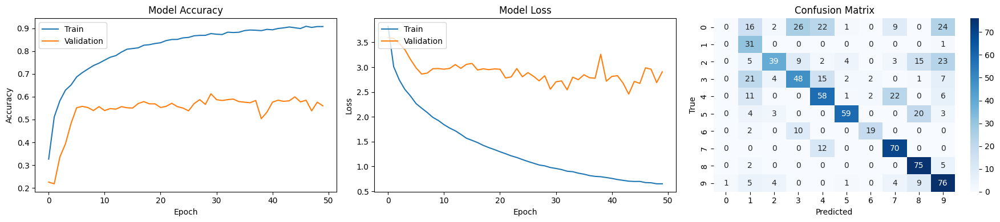

Fold 10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


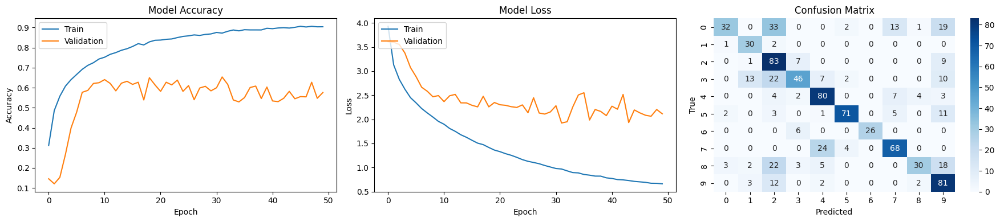


Average Accuracy for MLP: 0.5958
Standard Deviation for MLP Accuracy: 0.0414


In [ ]:
cv_scores_mlp = []

for fold in range(10):
    print(f"Fold {fold + 1}")
    train_data, train_labels, test_data, test_labels = prepare_datasetsda(fold, augment=True)

    

    mlp_model = build_MLP(input_neurons=512,
                      hidden_neurons=512,
                      output_neurons=10,
                      learning_rate=0.0003,
                      regulizer=0.001,
                      dropout=0.5)

    history = train_MLP(mlp_model, train_data, train_labels, test_data, test_labels,
                        patience=20,
                        batch_size=128,
                        num_epochs=50)

    predictions = mlp_model.predict(test_data)
    predicted_labels = np.argmax(predictions, axis=1)
    
    plot_graphs(history, test_labels, predicted_labels, class_labels=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'])
    
    accuracy = accuracy_score(test_labels, predicted_labels)
    cv_scores_mlp.append(accuracy)

overall_average_accuracy_mlp = np.mean(cv_scores_mlp)
print(f"\nAverage Accuracy for MLP: {overall_average_accuracy_mlp:.4f}")
mlp_std = np.std(cv_scores_mlp)
print(f"Standard Deviation for MLP Accuracy: {mlp_std:.4f}")

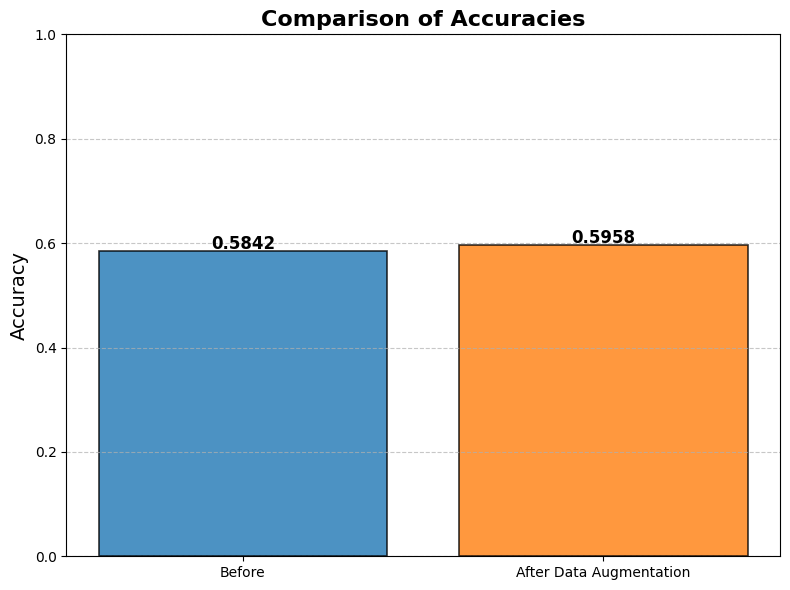

In [53]:
# Accuracies
accuracies = [0.5842, 0.5958]
labels = ['Before', 'After Data Augmentation']
colors = ['#1f77b4', '#ff7f0e']

# Plot
plt.figure(figsize=(8, 6))
bars = plt.bar(labels, accuracies, color=colors, alpha=0.8, edgecolor='black', linewidth=1.2)

# Add values on top of bars
for bar, acc in zip(bars, accuracies):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.005,
             f"{acc:.4f}", ha='center', fontsize=12, fontweight='bold')

# Customize
plt.title('Comparison of Accuracies', fontsize=16, fontweight='bold')
plt.ylabel('Accuracy', fontsize=14)
plt.ylim(0, 1)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show
plt.tight_layout()
plt.show()


**128 and 256 neurons (reduced overffiting**)

Fold 1
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


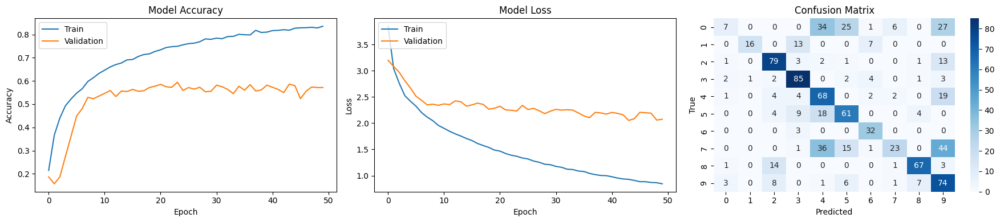

Fold 2
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


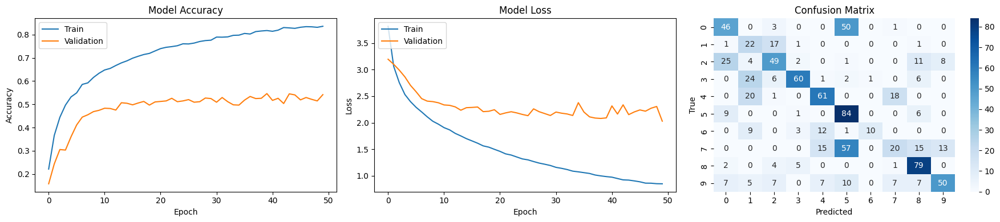

Fold 3
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


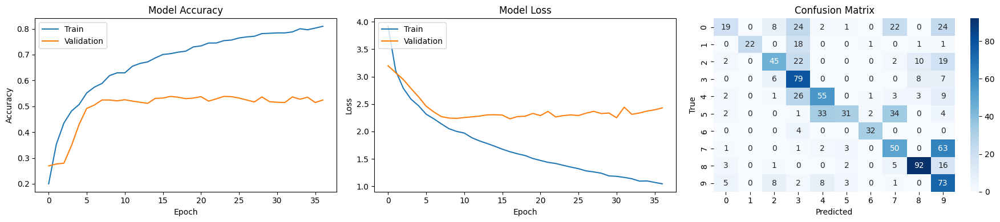

Fold 4
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


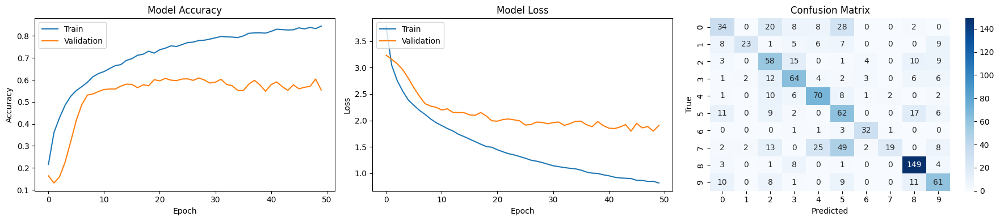

Fold 5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


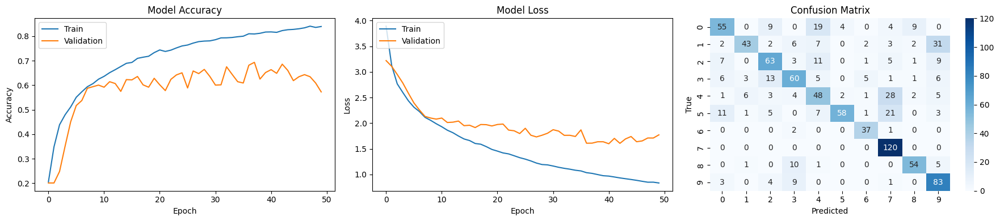

Fold 6
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


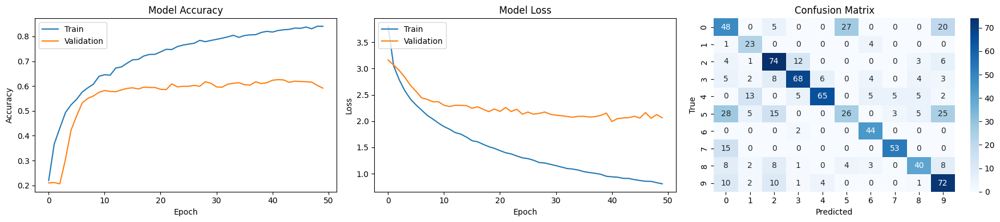

Fold 7
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


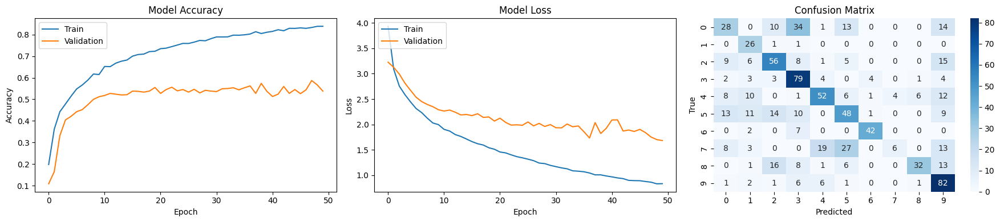

Fold 8
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


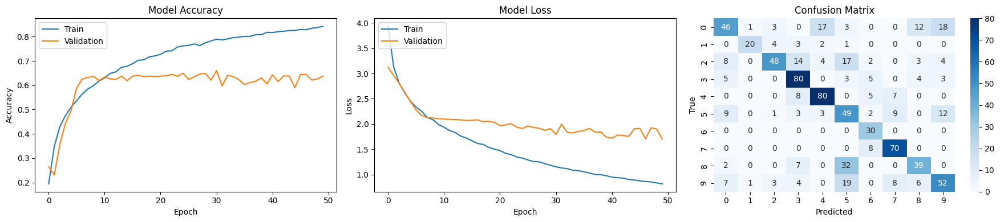

Fold 9
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


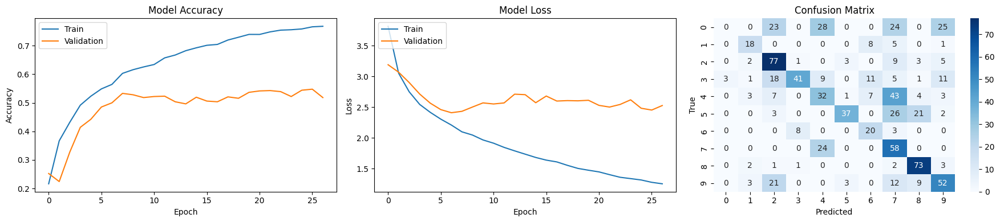

Fold 10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


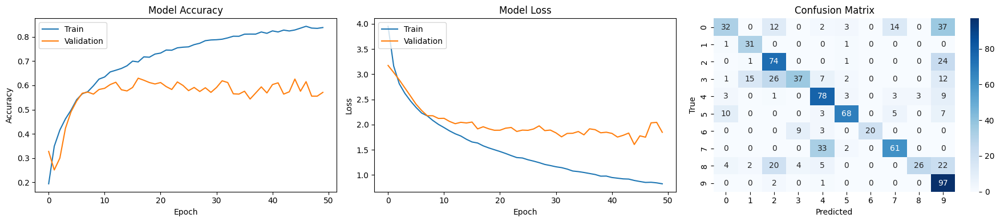


Average Accuracy for MLP: 0.5833
Standard Deviation for MLP Accuracy: 0.0506


In [30]:
cv_scores_mlp = []

for fold in range(10):
    print(f"Fold {fold + 1}")
    train_data, train_labels, test_data, test_labels = prepare_datasetsda(fold, augment=True)

    
    # default 512 neuronios
    #default 10 output
    mlp_model = build_MLP(input_neurons=256,
                      hidden_neurons=256,
                      output_neurons=10,
                      learning_rate=0.0003,
                      regulizer=0.001,
                      dropout=0.5)

    history = train_MLP(mlp_model, train_data, train_labels, test_data, test_labels,
                        patience=20,
                        batch_size=128, # default 128
                        num_epochs=50)

    predictions = mlp_model.predict(test_data)
    predicted_labels = np.argmax(predictions, axis=1)
    
    plot_graphs(history, test_labels, predicted_labels, class_labels=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'])
    
    accuracy = accuracy_score(test_labels, predicted_labels)
    cv_scores_mlp.append(accuracy)

overall_average_accuracy_mlp = np.mean(cv_scores_mlp)
print(f"\nAverage Accuracy for MLP: {overall_average_accuracy_mlp:.4f}")
mlp_std = np.std(cv_scores_mlp)
print(f"Standard Deviation for MLP Accuracy: {mlp_std:.4f}")

Fold 1
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


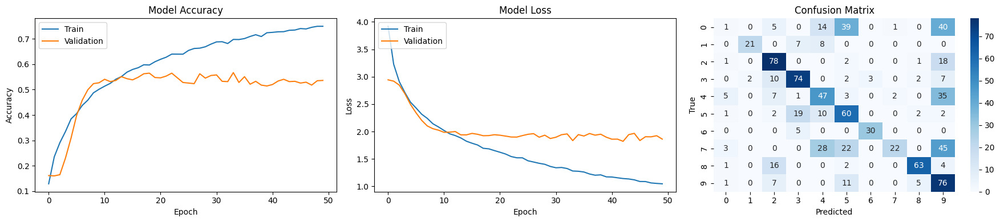

Fold 2
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


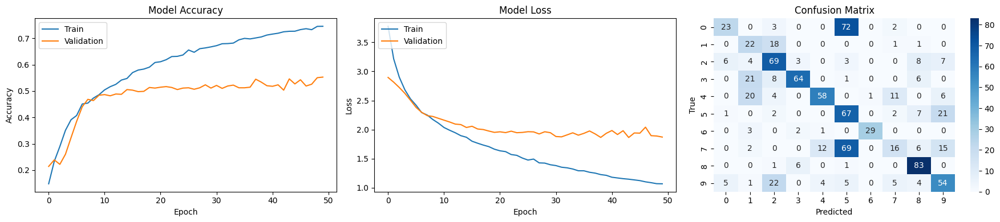

Fold 3
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


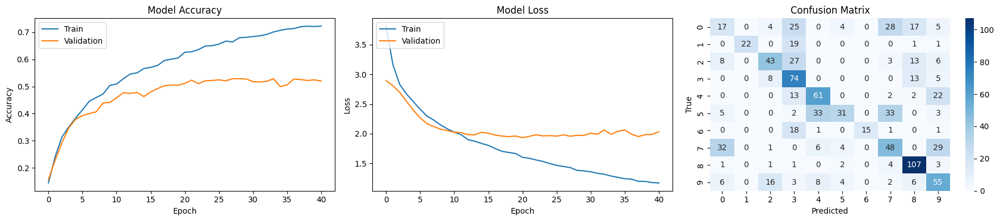

Fold 4
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


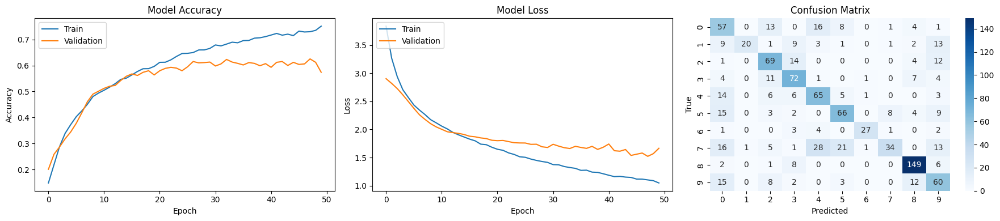

Fold 5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


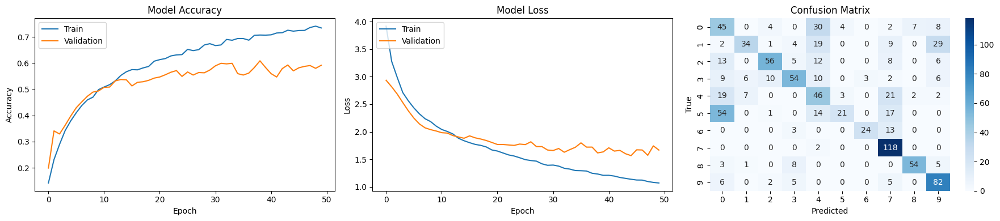

Fold 6
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


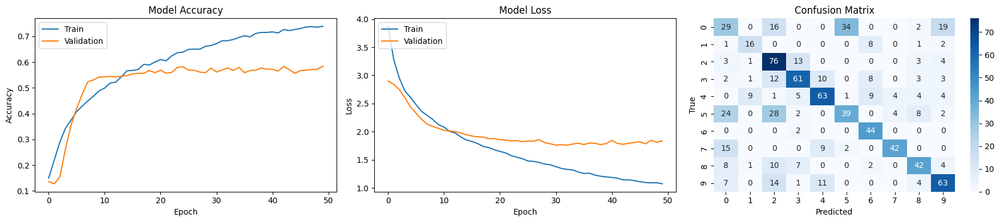

Fold 7
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


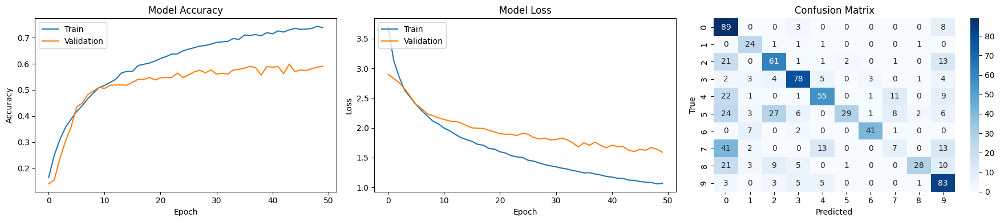

Fold 8
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


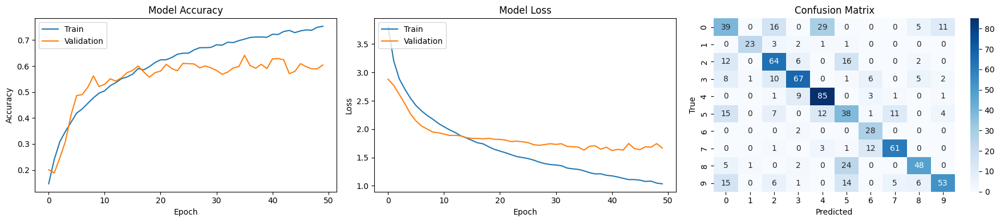

Fold 9
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


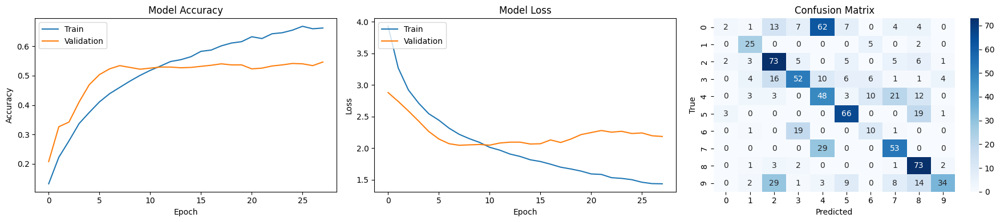

Fold 10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


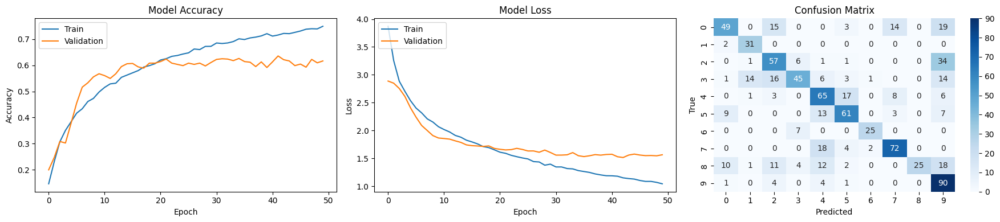


Average Accuracy for MLP: 0.5745
Standard Deviation for MLP Accuracy: 0.0393


In [27]:
cv_scores_mlp = []

for fold in range(10):
    print(f"Fold {fold + 1}")
    train_data, train_labels, test_data, test_labels = prepare_datasetsda(fold, augment=True)

    
    # default 512 neuronios
    #default 10 output
    mlp_model = build_MLP(input_neurons=128,
                      hidden_neurons=128,
                      output_neurons=10,
                      learning_rate=0.0003,
                      regulizer=0.001,
                      dropout=0.5)

    history = train_MLP(mlp_model, train_data, train_labels, test_data, test_labels,
                        patience=20,
                        batch_size=128, # default 128
                        num_epochs=50)

    predictions = mlp_model.predict(test_data)
    predicted_labels = np.argmax(predictions, axis=1)
    
    plot_graphs(history, test_labels, predicted_labels, class_labels=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'])
    
    accuracy = accuracy_score(test_labels, predicted_labels)
    cv_scores_mlp.append(accuracy)

overall_average_accuracy_mlp = np.mean(cv_scores_mlp)
print(f"\nAverage Accuracy for MLP: {overall_average_accuracy_mlp:.4f}")
mlp_std = np.std(cv_scores_mlp)
print(f"Standard Deviation for MLP Accuracy: {mlp_std:.4f}")

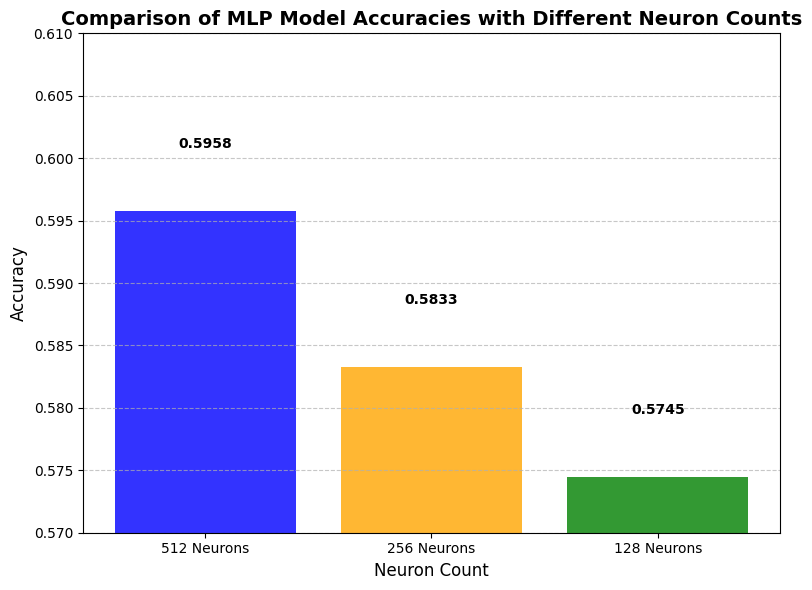

In [28]:
# Data for the accuracies
neurons = ['512 Neurons', '256 Neurons', '128 Neurons']
accuracies = [0.5958, 0.5833, 0.5745]

# Plotting the bar chart
plt.figure(figsize=(8, 6))
bars = plt.bar(neurons, accuracies, color=['blue', 'orange', 'green'], alpha=0.8)

# Adding value labels on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.005, f'{height:.4f}',
             ha='center', fontsize=10, fontweight='bold')

# Adding labels and title
plt.ylim(0.57, 0.61)  # Adjust y-axis for better visibility
plt.title('Comparison of MLP Model Accuracies with Different Neuron Counts', fontsize=14, fontweight='bold')
plt.ylabel('Accuracy', fontsize=12)
plt.xlabel('Neuron Count', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Show the plot
plt.show()


Batch size 256

Fold 1
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


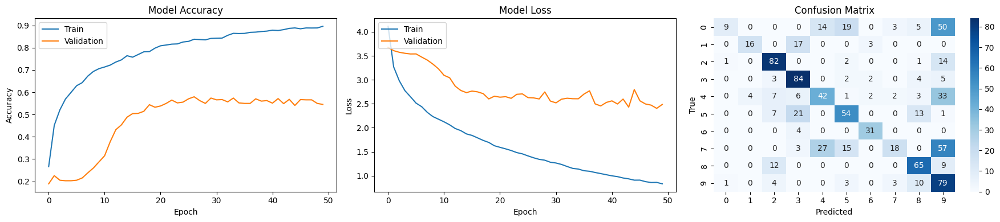

Fold 2
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


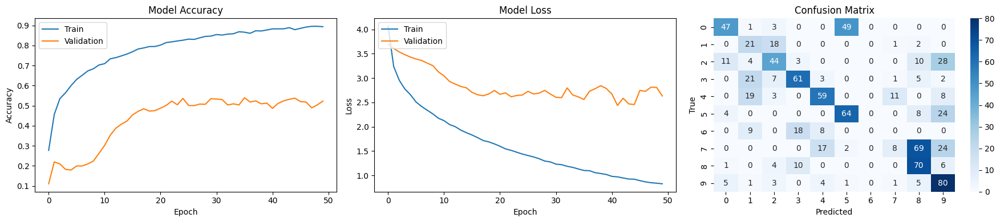

Fold 3
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


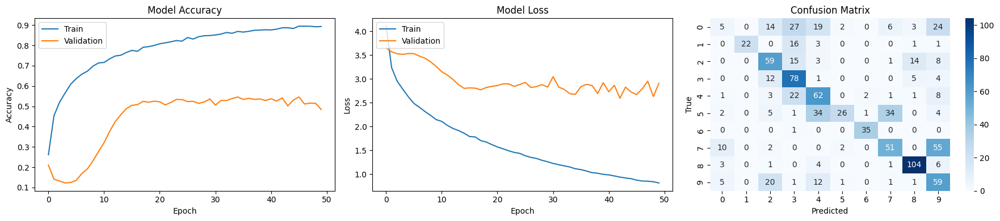

Fold 4
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


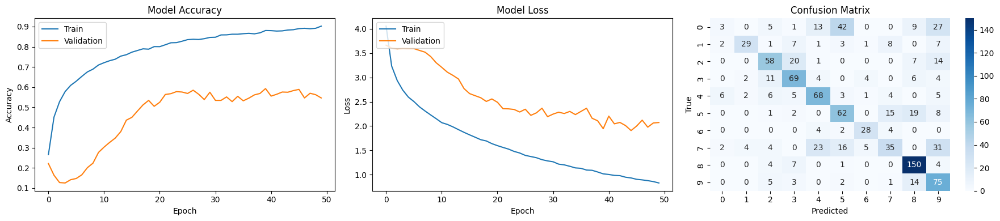

Fold 5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


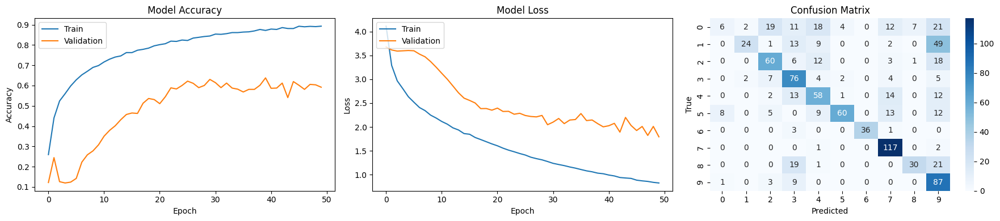

Fold 6
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


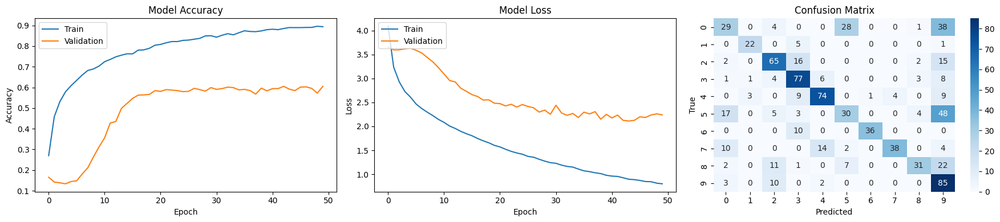

Fold 7
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


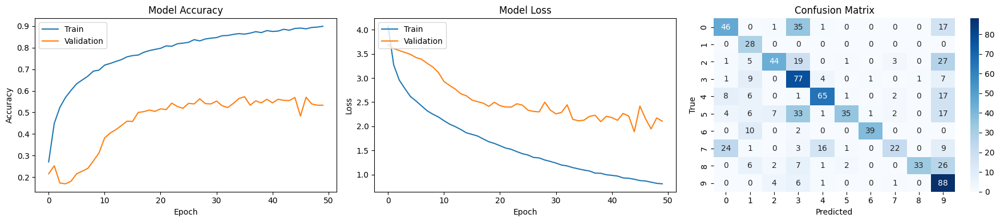

Fold 8
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


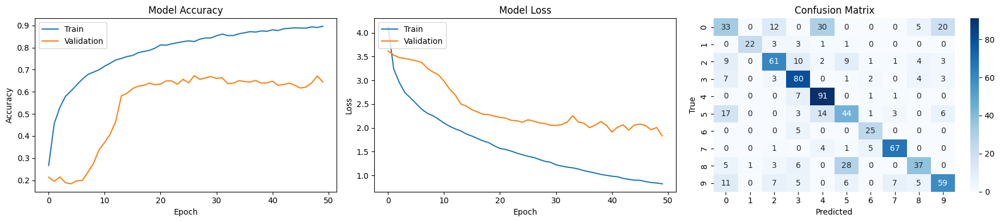

Fold 9
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


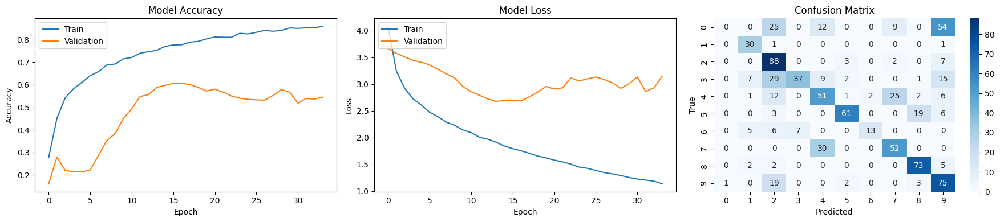

Fold 10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


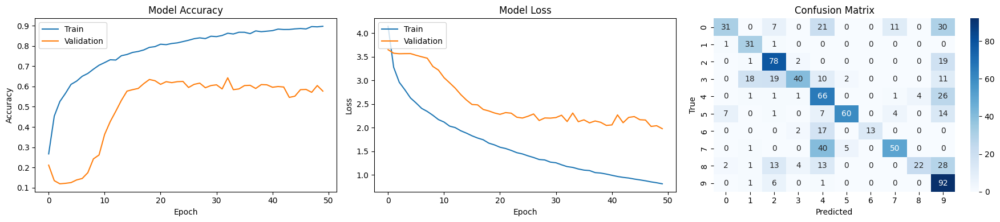


Average Accuracy for MLP: 0.5748
Standard Deviation for MLP Accuracy: 0.0338


In [54]:
cv_scores_mlp = []

for fold in range(10):
    print(f"Fold {fold + 1}")
    train_data, train_labels, test_data, test_labels = prepare_datasetsda(fold, augment=True)

    

    mlp_model = build_MLP(input_neurons=512,
                      hidden_neurons=512,
                      output_neurons=10,
                      learning_rate=0.0003,
                      regulizer=0.001,
                      dropout=0.5)

    history = train_MLP(mlp_model, train_data, train_labels, test_data, test_labels,
                        patience=20,
                        batch_size=256,
                        num_epochs=50)

    predictions = mlp_model.predict(test_data)
    predicted_labels = np.argmax(predictions, axis=1)
    
    plot_graphs(history, test_labels, predicted_labels, class_labels=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'])
    
    accuracy = accuracy_score(test_labels, predicted_labels)
    cv_scores_mlp.append(accuracy)

overall_average_accuracy_mlp = np.mean(cv_scores_mlp)
print(f"\nAverage Accuracy for MLP: {overall_average_accuracy_mlp:.4f}")
mlp_std = np.std(cv_scores_mlp)
print(f"Standard Deviation for MLP Accuracy: {mlp_std:.4f}")

Batch size 64

Fold 1
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


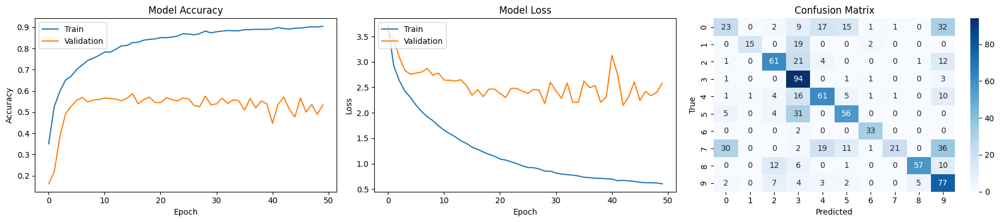

Fold 2
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


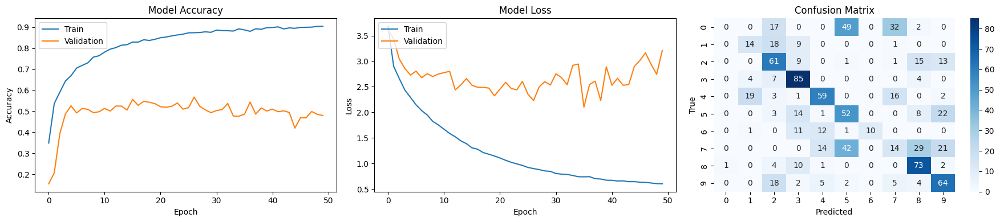

Fold 3
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


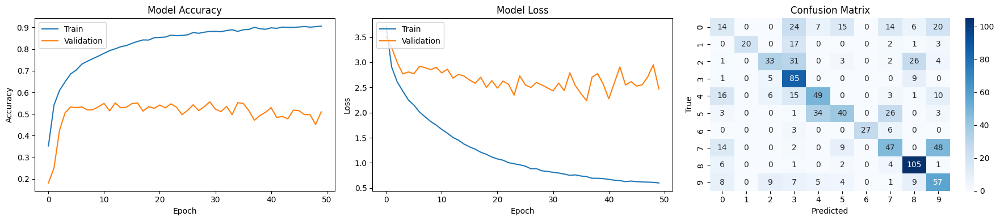

Fold 4
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


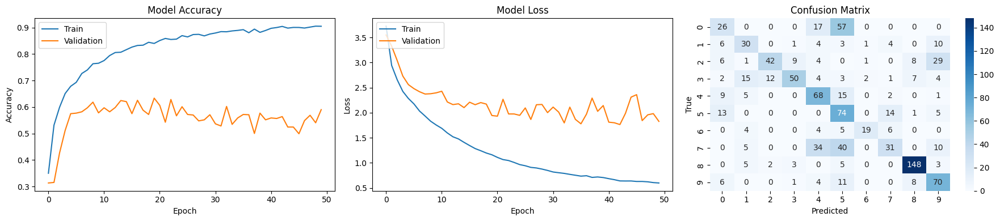

Fold 5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


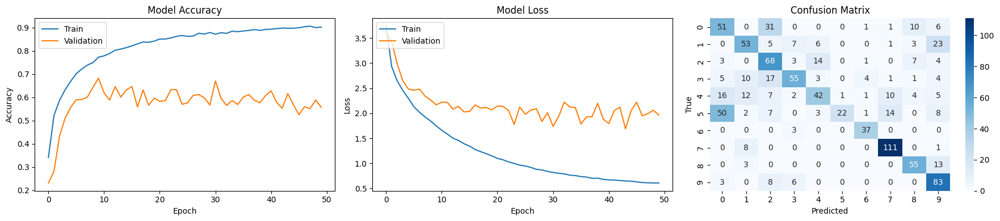

Fold 6
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


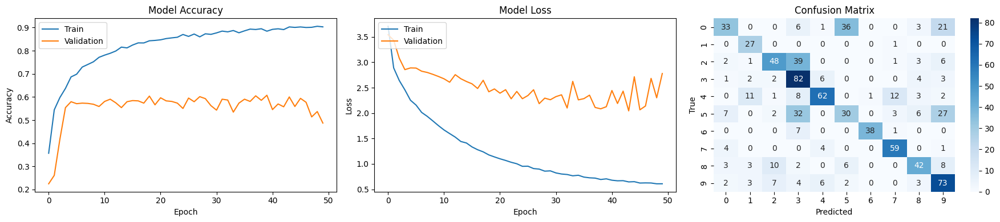

Fold 7
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


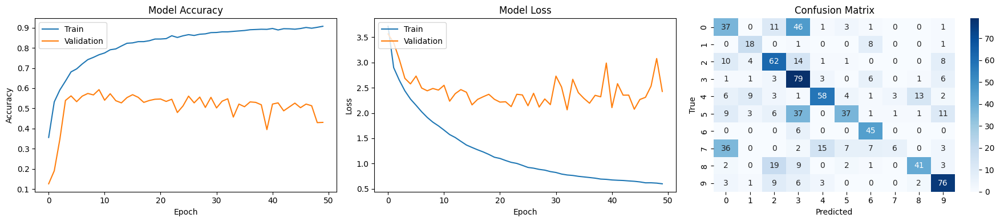

Fold 8
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


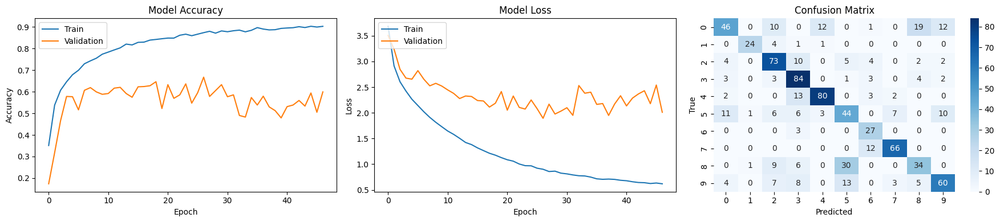

Fold 9
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


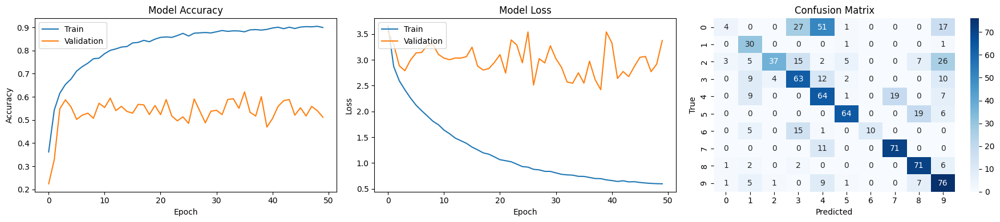

Fold 10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


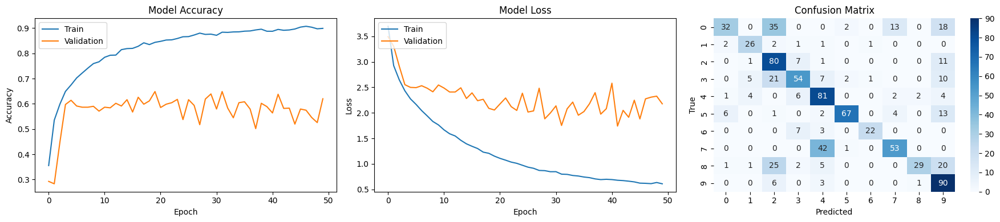


Average Accuracy for MLP: 0.5807
Standard Deviation for MLP Accuracy: 0.0524


In [29]:
cv_scores_mlp = []

for fold in range(10):
    print(f"Fold {fold + 1}")
    train_data, train_labels, test_data, test_labels = prepare_datasetsda(fold, augment=True)

    

    mlp_model = build_MLP(input_neurons=512,
                      hidden_neurons=512,
                      output_neurons=10,
                      learning_rate=0.0003,
                      regulizer=0.001,
                      dropout=0.5)

    history = train_MLP(mlp_model, train_data, train_labels, test_data, test_labels,
                        patience=20,
                        batch_size=64,
                        num_epochs=50)

    predictions = mlp_model.predict(test_data)
    predicted_labels = np.argmax(predictions, axis=1)
    
    plot_graphs(history, test_labels, predicted_labels, class_labels=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'])
    
    accuracy = accuracy_score(test_labels, predicted_labels)
    cv_scores_mlp.append(accuracy)

overall_average_accuracy_mlp = np.mean(cv_scores_mlp)
print(f"\nAverage Accuracy for MLP: {overall_average_accuracy_mlp:.4f}")
mlp_std = np.std(cv_scores_mlp)
print(f"Standard Deviation for MLP Accuracy: {mlp_std:.4f}")

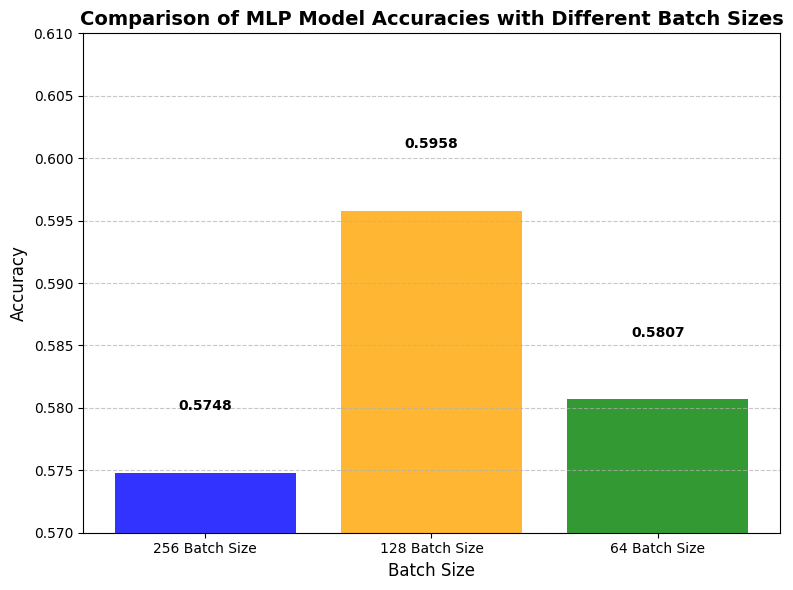

In [55]:
# Data for the accuracies
sizes = ['256 Batch Size', '128 Batch Size', '64 Batch Size']
accuracies = [0.5748, 0.5958, 0.5807]

# Plotting the bar chart
plt.figure(figsize=(8, 6))
bars = plt.bar(sizes, accuracies, color=['blue', 'orange', 'green'], alpha=0.8)

# Adding value labels on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.005, f'{height:.4f}',
             ha='center', fontsize=10, fontweight='bold')

# Adding labels and title
plt.ylim(0.57, 0.61)  # Adjust y-axis for better visibility
plt.title('Comparison of MLP Model Accuracies with Different Batch Sizes', fontsize=14, fontweight='bold')
plt.ylabel('Accuracy', fontsize=12)
plt.xlabel('Batch Size', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Show the plot
plt.show()


**Tuning 1st fold last for validation**

Reloading Tuner from mlp_tuning\mlp_tuning_fold_0_new\tuner0.json
Melhores hiperparâmetros (tuning no fold 0): {'input_neurons': 128, 'hidden_neurons': 512, 'learning_rate': 0.0001558856967730268, 'regulizer': 3.1221845212014837e-05, 'dropout': 0.5, 'tuner/epochs': 17, 'tuner/initial_epoch': 6, 'tuner/bracket': 3, 'tuner/round': 2, 'tuner/trial_id': '0037'}
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Acurácia no conjunto de teste (fold 1): 0.5248


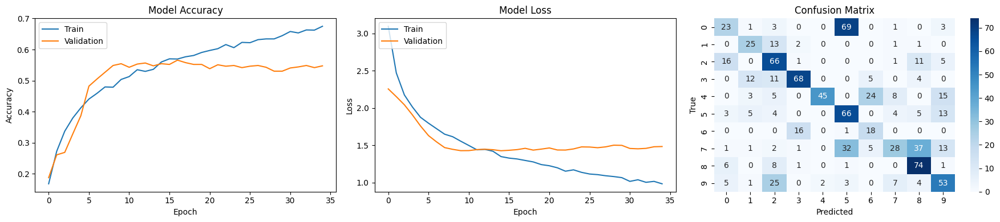

In [65]:

# Dados de teste (para o fold específico)
test_data_df = datasets[0]  # Supondo que você quer usar o fold 0 para validação
test_labels = test_data_df['Label'].values
test_data = test_data_df.drop(columns=['Label']).values

# Dados de treino (excluindo o fold 0)
train_datasets = datasets[2:]  # Exclui o fold 0, incluindo todos os outros
train_data_df = pd.concat(train_datasets)

train_labels = train_data_df['Label'].values
train_data = train_data_df.drop(columns=['Label']).values

def build_tunable_MLP(hp):
    input_neurons = hp.Int('input_neurons', min_value=128, max_value=1024, step=128)
    hidden_neurons = hp.Int('hidden_neurons', min_value=128, max_value=1024, step=128)
    learning_rate = hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log')
    regulizer = hp.Float('regulizer', min_value=1e-5, max_value=1e-2, sampling='log')
    dropout = hp.Float('dropout', min_value=0.2, max_value=0.7, step=0.1)

# Inicializar o tuner para o fold de tuning
tuner = kt.Hyperband(
    build_tunable_MLP,
    objective='val_accuracy',
    max_epochs=50,
    factor=3,
    directory='mlp_tuning',
    project_name='mlp_tuning_fold_0_new'
)

# Adicionar early stopping
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

# Realizar busca de hiperparâmetros no fold 0
tuner.search(train_data, train_labels,
             epochs=50,
             validation_data=(test_data, test_labels),
             callbacks=[stop_early])

# Obter os melhores hiperparâmetros
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Melhores hiperparâmetros (tuning no fold 0):", best_hps.values)

# Construir o modelo final com os melhores hiperparâmetros
mlp_model = build_MLP(
    input_neurons=best_hps.get('input_neurons'),
    hidden_neurons=best_hps.get('hidden_neurons'),
    output_neurons=10,
    learning_rate=best_hps.get('learning_rate'),
    regulizer=best_hps.get('regulizer'),
    dropout=best_hps.get('dropout')
)

# Treinar o modelo usando os folds 2 a 9
history = train_MLP(mlp_model, train_data, train_labels, test_data, test_labels,
                    patience=20,
                    batch_size=128,
                    num_epochs=50)

unseen_data = datasets[1].drop(columns=['Label']).values
unseen_labels = datasets[1]['Label'].values

# Avaliar no conjunto de teste (fold 1)
predictions = mlp_model.predict(unseen_data)
predicted_labels = np.argmax(predictions, axis=1)

# Métrica final no conjunto de teste
accuracy = accuracy_score(unseen_labels, predicted_labels)
print(f"Acurácia no conjunto de teste (fold 1): {accuracy:.4f}")

# Visualizar os resultados
plot_graphs(history, unseen_labels, predicted_labels,
            class_labels=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'])


Final with the best hps 

Fold 1
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


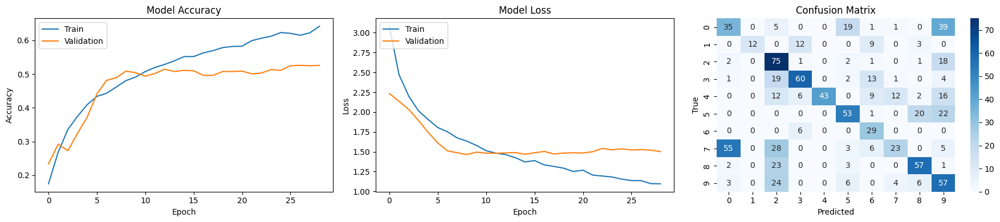

Fold 2
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


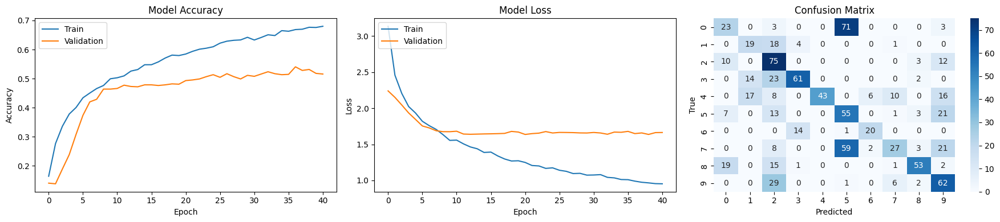

Fold 3
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


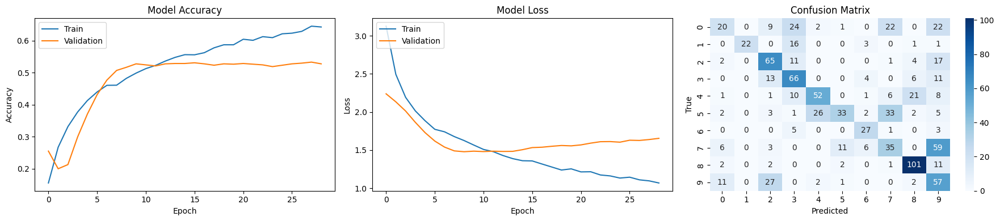

Fold 4
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


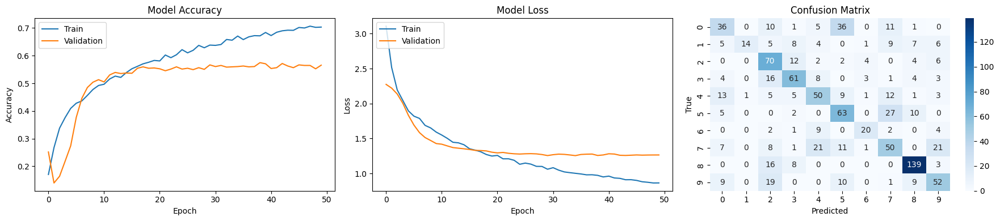

Fold 5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


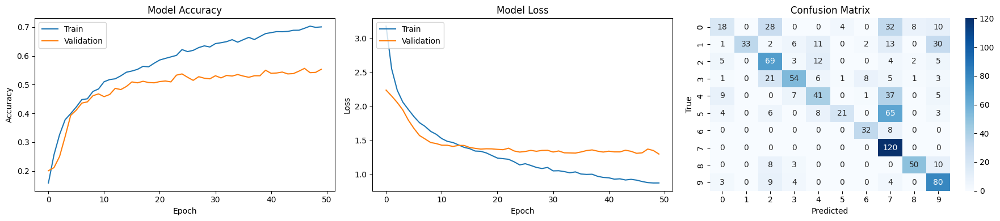

Fold 6
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


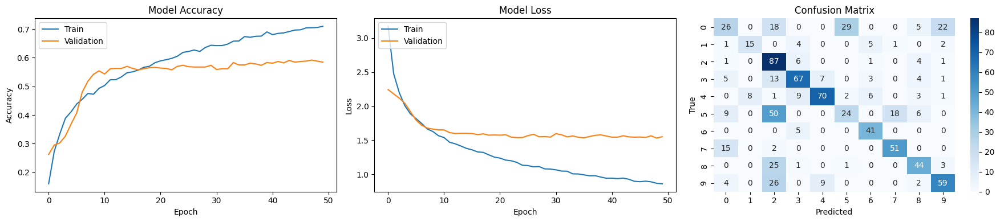

Fold 7
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


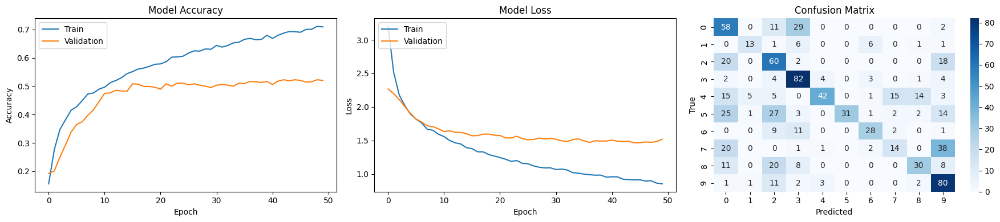

Fold 8
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


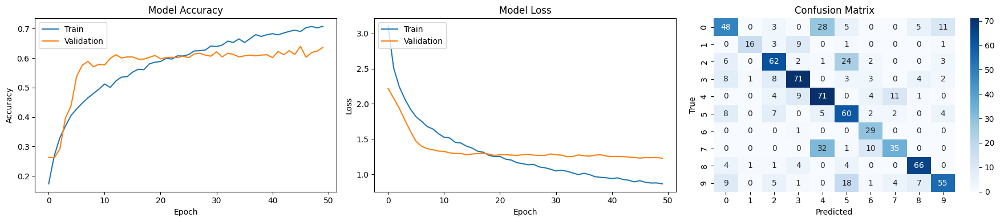

Fold 9
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


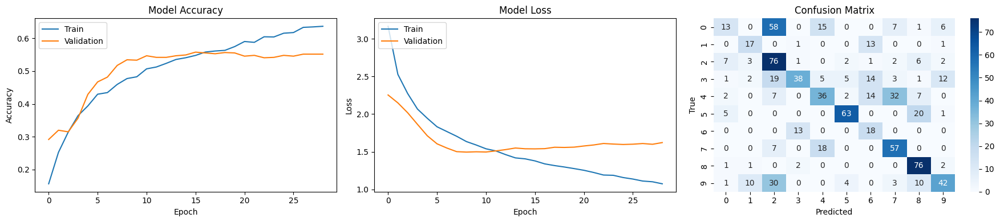

Fold 10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


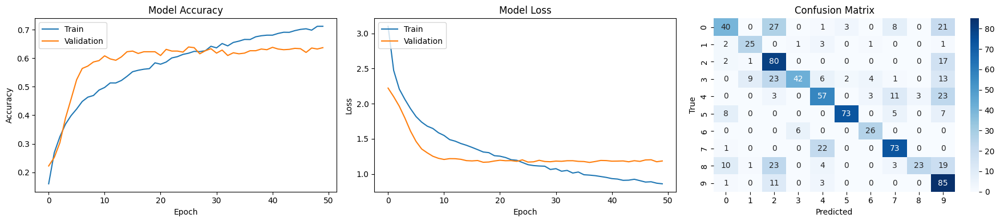

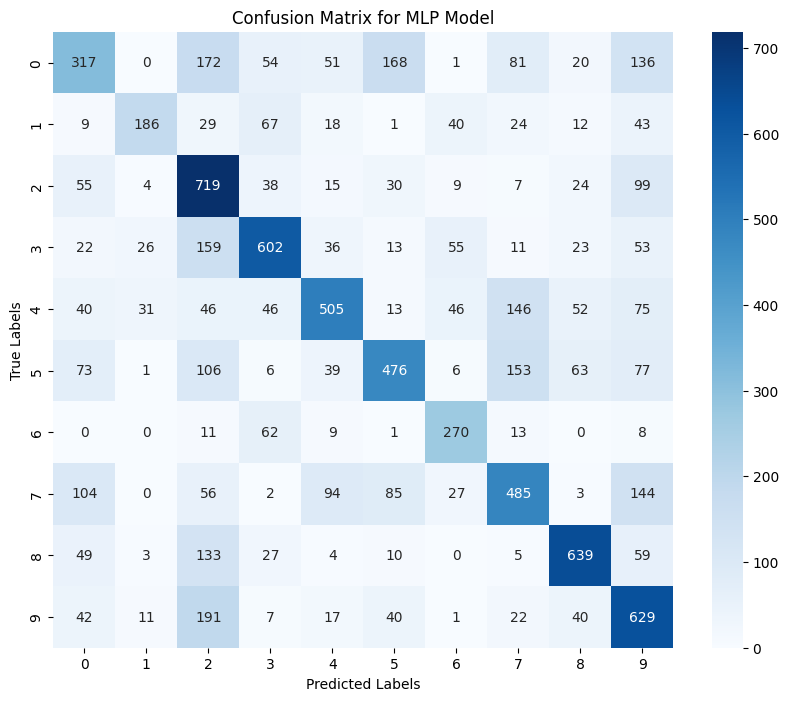


Average Accuracy for MLP: 0.5540
Standard Deviation for MLP Accuracy: 0.0466


In [74]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cv_scores_mlp = []
all_true_labels = []
all_predicted_labels = []

for fold in range(10):
    print(f"Fold {fold + 1}")
    train_data, train_labels, test_data, test_labels = prepare_datasetsda(fold, augment=True)

    mlp_model = build_MLP(input_neurons=128,
                      hidden_neurons=512,
                      output_neurons=10,
                      learning_rate=0.0001558856967730268,
                      regulizer=3.1221845212014837e-05,
                      dropout=0.5)

    history = train_MLP(mlp_model, train_data, train_labels, test_data, test_labels,
                        patience=20,
                        batch_size=128,
                        num_epochs=50)

    predictions = mlp_model.predict(test_data)
    predicted_labels = np.argmax(predictions, axis=1)
    
    plot_graphs(history, test_labels, predicted_labels, class_labels=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'])
    
    accuracy = accuracy_score(test_labels, predicted_labels)
    cv_scores_mlp.append(accuracy)

    # Acumula os rótulos verdadeiros e as previsões
    all_true_labels.extend(test_labels)
    all_predicted_labels.extend(predicted_labels)

# Calcula a matriz de confusão no final
conf_matrix = confusion_matrix(all_true_labels, all_predicted_labels)

# Exibe a matriz de confusão usando o Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=[str(i) for i in range(10)], yticklabels=[str(i) for i in range(10)])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for MLP Model')
plt.show()

# Calcula a média e desvio padrão da acurácia
overall_average_accuracy_mlp = np.mean(cv_scores_mlp)
print(f"\nAverage Accuracy for MLP: {overall_average_accuracy_mlp:.4f}")
mlp_std = np.std(cv_scores_mlp)
print(f"Standard Deviation for MLP Accuracy: {mlp_std:.4f}")


### References

- Salamon, J., Jacoby, C., & Bello, J. P. (2014). A dataset and taxonomy for urban sound research. ACM International Conference Proceeding Series.

- Kim, S., & Lee, S.-P. (2023). A BiLSTM–Transformer and 2D CNN architecture for emotion recognition from speech. Electronics, 12(4034).

- Wilkinson, N., & Niesler, T. (2021). A hybrid CNN-BiLSTM voice activity detector.